In [1]:
# Copyright (c) Meta Platforms, Inc. and affiliates.

# Video segmentation with SAM 2

This notebook shows how to use SAM 2 for interactive segmentation in videos. It will cover the following:

- adding clicks (or box) on a frame to get and refine _masklets_ (spatio-temporal masks)
- propagating clicks (or box) to get _masklets_ throughout the video
- segmenting and tracking multiple objects at the same time

We use the terms _segment_ or _mask_ to refer to the model prediction for an object on a single frame, and _masklet_ to refer to the spatio-temporal masks across the entire video. 

<a target="_blank" href="https://colab.research.google.com/github/facebookresearch/sam2/blob/main/notebooks/video_predictor_example.ipynb">
  <img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/>
</a>

## Environment Set-up

If running locally using jupyter, first install `sam2` in your environment using the [installation instructions](https://github.com/facebookresearch/sam2#installation) in the repository.

If running from Google Colab, set `using_colab=True` below and run the cell. In Colab, be sure to select 'GPU' under 'Edit'->'Notebook Settings'->'Hardware accelerator'. Note that it's recommended to use **A100 or L4 GPUs when running in Colab** (T4 GPUs might also work, but could be slow and might run out of memory in some cases).

In [2]:
using_colab = False

In [3]:
if using_colab:
    import torch
    import torchvision
    print("PyTorch version:", torch.__version__)
    print("Torchvision version:", torchvision.__version__)
    print("CUDA is available:", torch.cuda.is_available())
    import sys
    !{sys.executable} -m pip install opencv-python matplotlib
    !{sys.executable} -m pip install 'git+https://github.com/facebookresearch/sam2.git'

    !mkdir -p videos
    !wget -P videos https://dl.fbaipublicfiles.com/segment_anything_2/assets/bedroom.zip
    !unzip -d videos videos/bedroom.zip

    !mkdir -p ../checkpoints/
    !wget -P ../checkpoints/ https://dl.fbaipublicfiles.com/segment_anything_2/092824/sam2.1_hiera_large.pt

## Set-up

In [4]:
import os
# if using Apple MPS, fall back to CPU for unsupported ops
os.environ["PYTORCH_ENABLE_MPS_FALLBACK"] = "1"
import numpy as np
import torch
import matplotlib.pyplot as plt
from PIL import Image

In [5]:
# select the device for computation
if torch.cuda.is_available():
    device = torch.device("cuda")
elif torch.backends.mps.is_available():
    device = torch.device("mps")
else:
    device = torch.device("cpu")
print(f"using device: {device}")

if device.type == "cuda":
    # use bfloat16 for the entire notebook
    torch.autocast("cuda", dtype=torch.bfloat16).__enter__()
    # turn on tfloat32 for Ampere GPUs (https://pytorch.org/docs/stable/notes/cuda.html#tensorfloat-32-tf32-on-ampere-devices)
    if torch.cuda.get_device_properties(0).major >= 8:
        torch.backends.cuda.matmul.allow_tf32 = True
        torch.backends.cudnn.allow_tf32 = True
elif device.type == "mps":
    print(
        "\nSupport for MPS devices is preliminary. SAM 2 is trained with CUDA and might "
        "give numerically different outputs and sometimes degraded performance on MPS. "
        "See e.g. https://github.com/pytorch/pytorch/issues/84936 for a discussion."
    )

using device: cuda


### Loading the SAM 2 video predictor

In [6]:
import sys, os

sys.path.append(os.path.abspath('..'))

from sam2.build_sam import build_sam2_video_predictor

sam2_checkpoint = "../checkpoints/sam2.1_hiera_large.pt"
model_cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"

predictor = build_sam2_video_predictor(model_cfg, sam2_checkpoint, device=device)

In [7]:
def show_mask(mask, ax, obj_id=None, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        cmap = plt.get_cmap("tab10")
        cmap_idx = 0 if obj_id is None else obj_id
        color = np.array([*cmap(cmap_idx)[:3], 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)


def show_points(coords, labels, ax, marker_size=200):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)


def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0, 0, 0, 0), lw=2))

#### Select an example video

We assume that the video is stored as a list of JPEG frames with filenames like `<frame_index>.jpg`.

For your custom videos, you can extract their JPEG frames using ffmpeg (https://ffmpeg.org/) as follows:
```
ffmpeg -i <your_video>.mp4 -q:v 2 -start_number 0 <output_dir>/'%05d.jpg'
```
where `-q:v` generates high-quality JPEG frames and `-start_number 0` asks ffmpeg to start the JPEG file from `00000.jpg`.

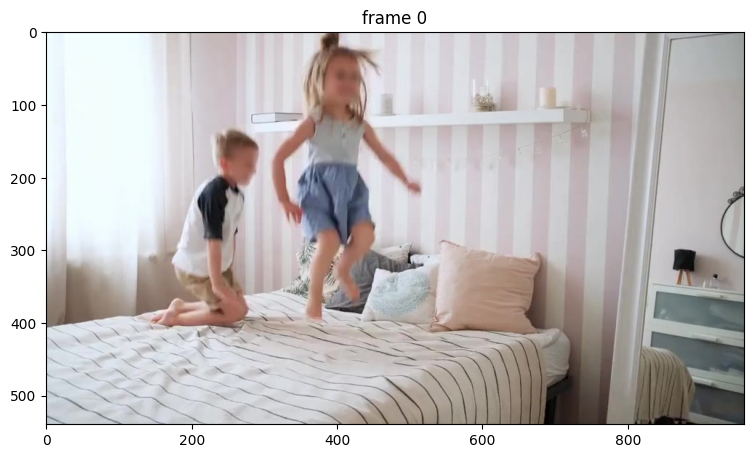

In [8]:
# `video_dir` a directory of JPEG frames with filenames like `<frame_index>.jpg`
video_dir = "./videos/bedroom"

# scan all the JPEG frame names in this directory
frame_names = [
    p for p in os.listdir(video_dir)
    if os.path.splitext(p)[-1] in [".jpg", ".jpeg", ".JPG", ".JPEG"]
]
frame_names.sort(key=lambda p: int(os.path.splitext(p)[0]))

# take a look the first video frame
frame_idx = 0
plt.figure(figsize=(9, 6))
plt.title(f"frame {frame_idx}")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[frame_idx])))

#### Initialize the inference state

SAM 2 requires stateful inference for interactive video segmentation, so we need to initialize an **inference state** on this video.

During initialization, it loads all the JPEG frames in `video_path` and stores their pixels in `inference_state` (as shown in the progress bar below).

In [9]:
inference_state = predictor.init_state(video_path=video_dir)

frame loading (JPEG): 100%|██████████| 200/200 [00:05<00:00, 37.61it/s]


### Example 1: Segment & track one object

Note: if you have run any previous tracking using this `inference_state`, please reset it first via `reset_state`.

(The cell below is just for illustration; it's not needed to call `reset_state` here as this `inference_state` is just freshly initialized above.)

In [10]:
predictor.reset_state(inference_state)

#### Step 1: Add a first click on a frame

To get started, let's try to segment the child on the left.

Here we make a **positive click** at (x, y) = (210, 350) with label `1`, by sending their coordinates and labels into the `add_new_points_or_box` API.

Note: label `1` indicates a *positive click (to add a region)* while label `0` indicates a *negative click (to remove a region)*.

c:\computer\111LYQ12138\computer\ECS270\Final project\FrameSkipSAM\sam2\sam2_video_predictor.py:947: UserWarning: cannot import name '_C' from 'sam2' (c:\computer\111LYQ12138\computer\ECS270\Final project\FrameSkipSAM\sam2\__init__.py)

Skipping the post-processing step due to the error above. You can still use SAM 2 and it's OK to ignore the error above, although some post-processing functionality may be limited (which doesn't affect the results in most cases; see https://github.com/facebookresearch/sam2/blob/main/INSTALL.md).
  pred_masks_gpu = fill_holes_in_mask_scores(


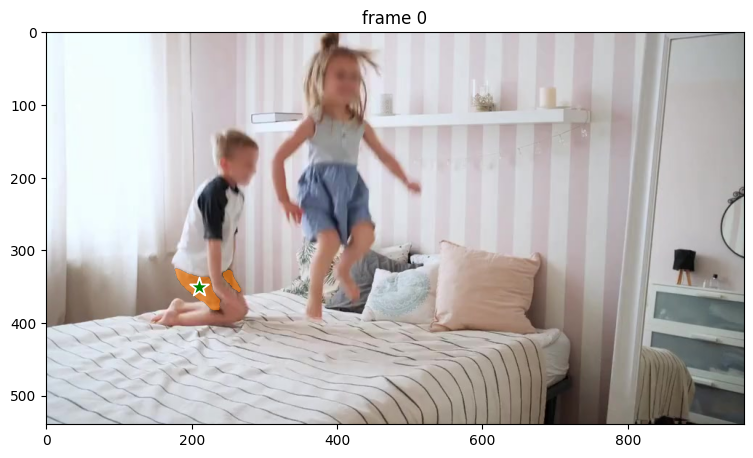

In [11]:
ann_frame_idx = 0  # the frame index we interact with
ann_obj_id = 1  # give a unique id to each object we interact with (it can be any integers)

# Let's add a positive click at (x, y) = (210, 350) to get started
points = np.array([[210, 350]], dtype=np.float32)
# for labels, `1` means positive click and `0` means negative click
labels = np.array([1], np.int32)
_, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
    inference_state=inference_state,
    frame_idx=ann_frame_idx,
    obj_id=ann_obj_id,
    points=points,
    labels=labels,
)

# show the results on the current (interacted) frame
plt.figure(figsize=(9, 6))
plt.title(f"frame {ann_frame_idx}")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[ann_frame_idx])))
show_points(points, labels, plt.gca())
show_mask((out_mask_logits[0] > 0.0).cpu().numpy(), plt.gca(), obj_id=out_obj_ids[0])

#### Step 2: Add a second click to refine the prediction

Hmm, it seems that although we wanted to segment the child on the left, the model predicts the mask for only the shorts -- this can happen since there is ambiguity from a single click about what the target object should be. We can refine the mask on this frame via another positive click on the child's shirt.

Here we make a **second positive click** at (x, y) = (250, 220) with label `1` to expand the mask.

Note: we need to send **all the clicks and their labels** (i.e. not just the last click) when calling `add_new_points_or_box`.

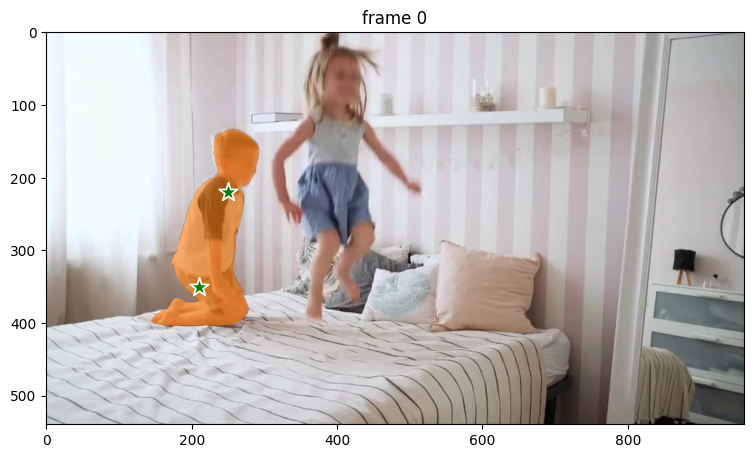

In [12]:
ann_frame_idx = 0  # the frame index we interact with
ann_obj_id = 1  # give a unique id to each object we interact with (it can be any integers)

# Let's add a 2nd positive click at (x, y) = (250, 220) to refine the mask
# sending all clicks (and their labels) to `add_new_points_or_box`
points = np.array([[210, 350], [250, 220]], dtype=np.float32)
# for labels, `1` means positive click and `0` means negative click
labels = np.array([1, 1], np.int32)
_, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
    inference_state=inference_state,
    frame_idx=ann_frame_idx,
    obj_id=ann_obj_id,
    points=points,
    labels=labels,
)

# show the results on the current (interacted) frame
plt.figure(figsize=(9, 6))
plt.title(f"frame {ann_frame_idx}")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[ann_frame_idx])))
show_points(points, labels, plt.gca())
show_mask((out_mask_logits[0] > 0.0).cpu().numpy(), plt.gca(), obj_id=out_obj_ids[0])

With this 2nd refinement click, now we get a segmentation mask of the entire child on frame 0.

#### Step 3: Propagate the prompts to get the masklet across the video

To get the masklet throughout the entire video, we propagate the prompts using the `propagate_in_video` API.

propagate in video:   1%|          | 2/200 [00:00<00:32,  6.04it/s]

Processing frame 1 - Global MAD: 0.0292, Masked MAD: 0.1081


propagate in video:   2%|▏         | 3/200 [00:00<00:51,  3.86it/s]

Processing frame 2 - Global MAD: 0.0290, Masked MAD: 0.0827


propagate in video:   2%|▏         | 4/200 [00:01<00:54,  3.60it/s]

Processing frame 3 - Global MAD: 0.0303, Masked MAD: 0.0629


propagate in video:   2%|▎         | 5/200 [00:01<00:56,  3.46it/s]

Processing frame 4 - Global MAD: 0.0326, Masked MAD: 0.0612


propagate in video:   3%|▎         | 6/200 [00:01<00:57,  3.35it/s]

Processing frame 5 - Global MAD: 0.0269, Masked MAD: 0.0798


propagate in video:   4%|▎         | 7/200 [00:01<00:59,  3.26it/s]

Processing frame 6 - Global MAD: 0.0254, Masked MAD: 0.1029
Processing frame 7 - Global MAD: 0.0298, Masked MAD: 0.1217


propagate in video:   4%|▍         | 9/200 [00:02<01:00,  3.14it/s]

Processing frame 8 - Global MAD: 0.0307, Masked MAD: 0.1450


propagate in video:   5%|▌         | 10/200 [00:02<01:01,  3.11it/s]

Processing frame 9 - Global MAD: 0.0292, Masked MAD: 0.1686


propagate in video:   6%|▌         | 11/200 [00:03<01:01,  3.09it/s]

Processing frame 10 - Global MAD: 0.0290, Masked MAD: 0.1859
Processing frame 11 - Global MAD: 0.0281, Masked MAD: 0.1771


propagate in video:   6%|▋         | 13/200 [00:03<01:02,  2.98it/s]

Processing frame 12 - Global MAD: 0.0263, Masked MAD: 0.1475


propagate in video:   7%|▋         | 14/200 [00:04<01:01,  3.00it/s]

Processing frame 13 - Global MAD: 0.0222, Masked MAD: 0.0630


propagate in video:   8%|▊         | 15/200 [00:04<01:01,  3.00it/s]

Processing frame 14 - Global MAD: 0.0241, Masked MAD: 0.1051
Processing frame 15 - Global MAD: 0.0261, Masked MAD: 0.1339


propagate in video:   8%|▊         | 17/200 [00:05<01:02,  2.92it/s]

Processing frame 16 - Global MAD: 0.0267, Masked MAD: 0.1394
Processing frame 17 - Global MAD: 0.0280, Masked MAD: 0.1477


propagate in video:  10%|▉         | 19/200 [00:06<01:00,  2.97it/s]

Processing frame 18 - Global MAD: 0.0275, Masked MAD: 0.1322


propagate in video:  10%|█         | 20/200 [00:06<01:00,  2.98it/s]

Processing frame 19 - Global MAD: 0.0266, Masked MAD: 0.1247
Processing frame 20 - Global MAD: 0.0268, Masked MAD: 0.1198


propagate in video:  11%|█         | 22/200 [00:07<00:59,  3.01it/s]

Processing frame 21 - Global MAD: 0.0260, Masked MAD: 0.1204


propagate in video:  12%|█▏        | 23/200 [00:07<00:58,  3.01it/s]

Processing frame 22 - Global MAD: 0.0203, Masked MAD: 0.0989
Processing frame 23 - Global MAD: 0.0163, Masked MAD: 0.0814


propagate in video:  12%|█▎        | 25/200 [00:08<00:58,  2.99it/s]

Processing frame 24 - Global MAD: 0.0182, Masked MAD: 0.0829
Processing frame 25 - Global MAD: 0.0212, Masked MAD: 0.0915


propagate in video:  14%|█▎        | 27/200 [00:08<00:57,  3.02it/s]

Processing frame 26 - Global MAD: 0.0195, Masked MAD: 0.1041
Processing frame 27 - Global MAD: 0.0205, Masked MAD: 0.1222


propagate in video:  14%|█▍        | 29/200 [00:09<00:58,  2.90it/s]

Processing frame 28 - Global MAD: 0.0173, Masked MAD: 0.1342


propagate in video:  15%|█▌        | 30/200 [00:09<00:57,  2.93it/s]

Processing frame 29 - Global MAD: 0.0182, Masked MAD: 0.1549


propagate in video:  16%|█▌        | 31/200 [00:10<00:57,  2.96it/s]

Processing frame 30 - Global MAD: 0.0176, Masked MAD: 0.1738
Avg FPS last 30 frames: 2.99


propagate in video:  16%|█▌        | 32/200 [00:10<00:56,  3.00it/s]

Processing frame 31 - Global MAD: 0.0212, Masked MAD: 0.1508


propagate in video:  16%|█▋        | 33/200 [00:10<00:55,  3.03it/s]

Processing frame 32 - Global MAD: 0.0192, Masked MAD: 0.0906


propagate in video:  17%|█▋        | 34/200 [00:11<00:54,  3.05it/s]

Processing frame 33 - Global MAD: 0.0205, Masked MAD: 0.0814
Processing frame 34 - Global MAD: 0.0229, Masked MAD: 0.1345


propagate in video:  18%|█▊        | 36/200 [00:11<00:53,  3.08it/s]

Processing frame 35 - Global MAD: 0.0215, Masked MAD: 0.1477
Processing frame 36 - Global MAD: 0.0195, Masked MAD: 0.1380


propagate in video:  19%|█▉        | 38/200 [00:12<00:52,  3.10it/s]

Processing frame 37 - Global MAD: 0.0197, Masked MAD: 0.1287


propagate in video:  20%|█▉        | 39/200 [00:12<00:51,  3.10it/s]

Processing frame 38 - Global MAD: 0.0242, Masked MAD: 0.1385


propagate in video:  20%|██        | 40/200 [00:12<00:51,  3.11it/s]

Processing frame 39 - Global MAD: 0.0245, Masked MAD: 0.1420


propagate in video:  20%|██        | 41/200 [00:13<00:51,  3.10it/s]

Processing frame 40 - Global MAD: 0.0226, Masked MAD: 0.1393


propagate in video:  21%|██        | 42/200 [00:13<00:50,  3.11it/s]

Processing frame 41 - Global MAD: 0.0183, Masked MAD: 0.1109
Processing frame 42 - Global MAD: 0.0145, Masked MAD: 0.0898


propagate in video:  22%|██▏       | 43/200 [00:13<00:50,  3.11it/s]

Processing frame 43 - Global MAD: 0.0136, Masked MAD: 0.0895


propagate in video:  22%|██▎       | 45/200 [00:14<00:49,  3.11it/s]

Processing frame 44 - Global MAD: 0.0135, Masked MAD: 0.0956


propagate in video:  23%|██▎       | 46/200 [00:14<00:49,  3.11it/s]

Processing frame 45 - Global MAD: 0.0140, Masked MAD: 0.0984


propagate in video:  24%|██▎       | 47/200 [00:15<00:49,  3.11it/s]

Processing frame 46 - Global MAD: 0.0154, Masked MAD: 0.1058
Processing frame 47 - Global MAD: 0.0161, Masked MAD: 0.1193


propagate in video:  24%|██▍       | 48/200 [00:15<00:48,  3.10it/s]

Processing frame 48 - Global MAD: 0.0170, Masked MAD: 0.1314


propagate in video:  25%|██▌       | 50/200 [00:16<00:48,  3.10it/s]

Processing frame 49 - Global MAD: 0.0187, Masked MAD: 0.1511


propagate in video:  26%|██▌       | 51/200 [00:16<00:48,  3.10it/s]

Processing frame 50 - Global MAD: 0.0204, Masked MAD: 0.1516
Processing frame 51 - Global MAD: 0.0227, Masked MAD: 0.1348


propagate in video:  26%|██▋       | 53/200 [00:17<00:47,  3.11it/s]

Processing frame 52 - Global MAD: 0.0193, Masked MAD: 0.0881


propagate in video:  27%|██▋       | 54/200 [00:17<00:46,  3.11it/s]

Processing frame 53 - Global MAD: 0.0178, Masked MAD: 0.1595
Processing frame 54 - Global MAD: 0.0248, Masked MAD: 0.1704


propagate in video:  28%|██▊       | 55/200 [00:17<00:46,  3.11it/s]

Processing frame 55 - Global MAD: 0.0251, Masked MAD: 0.1700


propagate in video:  28%|██▊       | 57/200 [00:18<00:46,  3.10it/s]

Processing frame 56 - Global MAD: 0.0233, Masked MAD: 0.1634


propagate in video:  29%|██▉       | 58/200 [00:18<00:47,  3.00it/s]

Processing frame 57 - Global MAD: 0.0208, Masked MAD: 0.1443


propagate in video:  30%|██▉       | 59/200 [00:19<00:46,  3.03it/s]

Processing frame 58 - Global MAD: 0.0205, Masked MAD: 0.1385
Processing frame 59 - Global MAD: 0.0184, Masked MAD: 0.1523


propagate in video:  30%|███       | 61/200 [00:19<00:46,  3.00it/s]

Processing frame 60 - Global MAD: 0.0154, Masked MAD: 0.1510
Avg FPS last 30 frames: 3.09
Processing frame 61 - Global MAD: 0.0164, Masked MAD: 0.1495


propagate in video:  32%|███▏      | 63/200 [00:20<00:44,  3.06it/s]

Processing frame 62 - Global MAD: 0.0173, Masked MAD: 0.1349


propagate in video:  32%|███▏      | 64/200 [00:20<00:44,  3.07it/s]

Processing frame 63 - Global MAD: 0.0188, Masked MAD: 0.1240
Processing frame 64 - Global MAD: 0.0192, Masked MAD: 0.1189


propagate in video:  32%|███▎      | 65/200 [00:21<00:43,  3.08it/s]

Processing frame 65 - Global MAD: 0.0199, Masked MAD: 0.1444


propagate in video:  34%|███▎      | 67/200 [00:21<00:42,  3.10it/s]

Processing frame 66 - Global MAD: 0.0209, Masked MAD: 0.1668


propagate in video:  34%|███▍      | 68/200 [00:22<00:42,  3.10it/s]

Processing frame 67 - Global MAD: 0.0216, Masked MAD: 0.1990


propagate in video:  34%|███▍      | 69/200 [00:22<00:42,  3.10it/s]

Processing frame 68 - Global MAD: 0.0171, Masked MAD: 0.2250
Processing frame 69 - Global MAD: 0.0203, Masked MAD: 0.2018


propagate in video:  35%|███▌      | 70/200 [00:22<00:41,  3.11it/s]

Processing frame 70 - Global MAD: 0.0227, Masked MAD: 0.1156


propagate in video:  36%|███▌      | 71/200 [00:22<00:41,  3.11it/s]

Processing frame 71 - Global MAD: 0.0205, Masked MAD: 0.0556


propagate in video:  36%|███▋      | 73/200 [00:23<00:40,  3.11it/s]

Processing frame 72 - Global MAD: 0.0246, Masked MAD: 0.1132
Processing frame 73 - Global MAD: 0.0249, Masked MAD: 0.1386


propagate in video:  37%|███▋      | 74/200 [00:23<00:40,  3.11it/s]

Processing frame 74 - Global MAD: 0.0213, Masked MAD: 0.1320


propagate in video:  38%|███▊      | 76/200 [00:24<00:39,  3.11it/s]

Processing frame 75 - Global MAD: 0.0201, Masked MAD: 0.1314


propagate in video:  38%|███▊      | 77/200 [00:24<00:39,  3.11it/s]

Processing frame 76 - Global MAD: 0.0162, Masked MAD: 0.1243


propagate in video:  39%|███▉      | 78/200 [00:25<00:39,  3.11it/s]

Processing frame 77 - Global MAD: 0.0162, Masked MAD: 0.1381
Processing frame 78 - Global MAD: 0.0184, Masked MAD: 0.1476


propagate in video:  40%|███▉      | 79/200 [00:25<00:38,  3.11it/s]

Processing frame 79 - Global MAD: 0.0201, Masked MAD: 0.1518


propagate in video:  40%|████      | 81/200 [00:26<00:40,  2.91it/s]

Processing frame 80 - Global MAD: 0.0208, Masked MAD: 0.1459


propagate in video:  41%|████      | 82/200 [00:26<00:40,  2.91it/s]

Processing frame 81 - Global MAD: 0.0207, Masked MAD: 0.1278
Processing frame 82 - Global MAD: 0.0224, Masked MAD: 0.0829


propagate in video:  42%|████▏     | 83/200 [00:26<00:40,  2.91it/s]

Processing frame 83 - Global MAD: 0.0240, Masked MAD: 0.0837


propagate in video:  42%|████▎     | 85/200 [00:27<00:39,  2.95it/s]

Processing frame 84 - Global MAD: 0.0255, Masked MAD: 0.0931
Processing frame 85 - Global MAD: 0.0187, Masked MAD: 0.0974


propagate in video:  44%|████▎     | 87/200 [00:28<00:37,  3.01it/s]

Processing frame 86 - Global MAD: 0.0244, Masked MAD: 0.1173
Processing frame 87 - Global MAD: 0.0281, Masked MAD: 0.0939


propagate in video:  44%|████▍     | 88/200 [00:28<00:37,  3.01it/s]

Processing frame 88 - Global MAD: 0.0267, Masked MAD: 0.1046


propagate in video:  44%|████▍     | 89/200 [00:28<00:36,  3.03it/s]

Processing frame 89 - Global MAD: 0.0253, Masked MAD: 0.0910


propagate in video:  46%|████▌     | 91/200 [00:29<00:35,  3.03it/s]

Processing frame 90 - Global MAD: 0.0238, Masked MAD: 0.0731
Avg FPS last 30 frames: 3.05


propagate in video:  46%|████▌     | 92/200 [00:29<00:29,  3.67it/s]

Skipping frame 91 - Global MAD: 0.0191, Masked MAD: 0.0512 (threshold: 0.05)
Processing frame 92 - Global MAD: 0.0285, Masked MAD: 0.1006


propagate in video:  47%|████▋     | 94/200 [00:30<00:31,  3.36it/s]

Processing frame 93 - Global MAD: 0.0206, Masked MAD: 0.1215
Processing frame 94 - Global MAD: 0.0202, Masked MAD: 0.1216


propagate in video:  48%|████▊     | 96/200 [00:31<00:33,  3.13it/s]

Processing frame 95 - Global MAD: 0.0213, Masked MAD: 0.1413
Processing frame 96 - Global MAD: 0.0229, Masked MAD: 0.1308


propagate in video:  49%|████▉     | 98/200 [00:31<00:32,  3.11it/s]

Processing frame 97 - Global MAD: 0.0232, Masked MAD: 0.1039
Processing frame 98 - Global MAD: 0.0229, Masked MAD: 0.1280


propagate in video:  50%|████▉     | 99/200 [00:32<00:32,  3.09it/s]

Processing frame 99 - Global MAD: 0.0237, Masked MAD: 0.1219


propagate in video:  50%|█████     | 101/200 [00:32<00:31,  3.10it/s]

Processing frame 100 - Global MAD: 0.0265, Masked MAD: 0.1401
Processing frame 101 - Global MAD: 0.0254, Masked MAD: 0.1459


propagate in video:  52%|█████▏    | 103/200 [00:33<00:31,  3.08it/s]

Processing frame 102 - Global MAD: 0.0173, Masked MAD: 0.1175
Processing frame 103 - Global MAD: 0.0265, Masked MAD: 0.1793


propagate in video:  52%|█████▏    | 104/200 [00:33<00:31,  3.09it/s]

Processing frame 104 - Global MAD: 0.0274, Masked MAD: 0.1678


propagate in video:  53%|█████▎    | 106/200 [00:34<00:30,  3.07it/s]

Processing frame 105 - Global MAD: 0.0279, Masked MAD: 0.1510
Processing frame 106 - Global MAD: 0.0287, Masked MAD: 0.1955


propagate in video:  54%|█████▎    | 107/200 [00:34<00:30,  3.05it/s]

Processing frame 107 - Global MAD: 0.0279, Masked MAD: 0.1969


propagate in video:  54%|█████▍    | 108/200 [00:34<00:30,  3.04it/s]

Processing frame 108 - Global MAD: 0.0253, Masked MAD: 0.1788


propagate in video:  55%|█████▌    | 110/200 [00:35<00:29,  3.05it/s]

Processing frame 109 - Global MAD: 0.0211, Masked MAD: 0.1126
Processing frame 110 - Global MAD: 0.0206, Masked MAD: 0.1023


propagate in video:  56%|█████▌    | 112/200 [00:36<00:28,  3.06it/s]

Processing frame 111 - Global MAD: 0.0226, Masked MAD: 0.1480
Processing frame 112 - Global MAD: 0.0229, Masked MAD: 0.1639


propagate in video:  57%|█████▋    | 114/200 [00:36<00:27,  3.08it/s]

Processing frame 113 - Global MAD: 0.0239, Masked MAD: 0.1638
Processing frame 114 - Global MAD: 0.0286, Masked MAD: 0.1658


propagate in video:  58%|█████▊    | 116/200 [00:37<00:27,  3.07it/s]

Processing frame 115 - Global MAD: 0.0308, Masked MAD: 0.1597


propagate in video:  58%|█████▊    | 117/200 [00:37<00:27,  3.07it/s]

Processing frame 116 - Global MAD: 0.0301, Masked MAD: 0.1633


propagate in video:  59%|█████▉    | 118/200 [00:38<00:26,  3.07it/s]

Processing frame 117 - Global MAD: 0.0297, Masked MAD: 0.1461
Processing frame 118 - Global MAD: 0.0315, Masked MAD: 0.1420


propagate in video:  60%|█████▉    | 119/200 [00:38<00:26,  3.07it/s]

Processing frame 119 - Global MAD: 0.0323, Masked MAD: 0.1189


propagate in video:  60%|██████    | 121/200 [00:39<00:27,  2.91it/s]

Processing frame 120 - Global MAD: 0.0249, Masked MAD: 0.1163
Avg FPS last 30 frames: 3.10
Processing frame 121 - Global MAD: 0.0319, Masked MAD: 0.1365


propagate in video:  61%|██████    | 122/200 [00:39<00:27,  2.85it/s]

Processing frame 122 - Global MAD: 0.0348, Masked MAD: 0.1558


propagate in video:  62%|██████▏   | 124/200 [00:40<00:26,  2.82it/s]

Processing frame 123 - Global MAD: 0.0364, Masked MAD: 0.1643
Processing frame 124 - Global MAD: 0.0357, Masked MAD: 0.1846


propagate in video:  62%|██████▎   | 125/200 [00:40<00:26,  2.79it/s]

Processing frame 125 - Global MAD: 0.0363, Masked MAD: 0.1945


propagate in video:  63%|██████▎   | 126/200 [00:41<00:26,  2.79it/s]

Processing frame 126 - Global MAD: 0.0363, Masked MAD: 0.1706


propagate in video:  64%|██████▎   | 127/200 [00:41<00:26,  2.72it/s]

Processing frame 127 - Global MAD: 0.0325, Masked MAD: 0.1035


propagate in video:  64%|██████▍   | 129/200 [00:42<00:27,  2.60it/s]

Processing frame 128 - Global MAD: 0.0289, Masked MAD: 0.0647


propagate in video:  65%|██████▌   | 130/200 [00:42<00:26,  2.60it/s]

Processing frame 129 - Global MAD: 0.0308, Masked MAD: 0.1184
Processing frame 130 - Global MAD: 0.0317, Masked MAD: 0.1291


propagate in video:  66%|██████▌   | 131/200 [00:43<00:26,  2.61it/s]

Processing frame 131 - Global MAD: 0.0350, Masked MAD: 0.1323


propagate in video:  66%|██████▌   | 132/200 [00:43<00:26,  2.56it/s]

Processing frame 132 - Global MAD: 0.0359, Masked MAD: 0.1296


propagate in video:  66%|██████▋   | 133/200 [00:43<00:26,  2.55it/s]

Processing frame 133 - Global MAD: 0.0360, Masked MAD: 0.1169


propagate in video:  67%|██████▋   | 134/200 [00:44<00:25,  2.55it/s]

Processing frame 134 - Global MAD: 0.0360, Masked MAD: 0.0933


propagate in video:  68%|██████▊   | 135/200 [00:44<00:25,  2.60it/s]

Processing frame 135 - Global MAD: 0.0347, Masked MAD: 0.0641


propagate in video:  68%|██████▊   | 136/200 [00:44<00:24,  2.61it/s]

Processing frame 136 - Global MAD: 0.0360, Masked MAD: 0.0638


propagate in video:  69%|██████▉   | 138/200 [00:45<00:23,  2.64it/s]

Processing frame 137 - Global MAD: 0.0337, Masked MAD: 0.0949
Processing frame 138 - Global MAD: 0.0290, Masked MAD: 0.1174


propagate in video:  70%|███████   | 140/200 [00:46<00:22,  2.65it/s]

Processing frame 139 - Global MAD: 0.0340, Masked MAD: 0.1351
Processing frame 140 - Global MAD: 0.0359, Masked MAD: 0.1575


propagate in video:  70%|███████   | 141/200 [00:46<00:21,  2.69it/s]

Processing frame 141 - Global MAD: 0.0376, Masked MAD: 0.1700


propagate in video:  71%|███████   | 142/200 [00:47<00:23,  2.52it/s]

Processing frame 142 - Global MAD: 0.0394, Masked MAD: 0.1685


propagate in video:  72%|███████▏  | 143/200 [00:47<00:23,  2.45it/s]

Processing frame 143 - Global MAD: 0.0375, Masked MAD: 0.1614


propagate in video:  72%|███████▏  | 144/200 [00:48<00:23,  2.41it/s]

Processing frame 144 - Global MAD: 0.0355, Masked MAD: 0.1479


propagate in video:  72%|███████▎  | 145/200 [00:48<00:22,  2.44it/s]

Processing frame 145 - Global MAD: 0.0304, Masked MAD: 0.0899


propagate in video:  73%|███████▎  | 146/200 [00:48<00:21,  2.49it/s]

Processing frame 146 - Global MAD: 0.0294, Masked MAD: 0.0620


propagate in video:  74%|███████▎  | 147/200 [00:49<00:21,  2.47it/s]

Processing frame 147 - Global MAD: 0.0321, Masked MAD: 0.1146


propagate in video:  74%|███████▍  | 148/200 [00:49<00:20,  2.48it/s]

Processing frame 148 - Global MAD: 0.0341, Masked MAD: 0.1111


propagate in video:  74%|███████▍  | 149/200 [00:50<00:20,  2.49it/s]

Processing frame 149 - Global MAD: 0.0373, Masked MAD: 0.1144


propagate in video:  75%|███████▌  | 150/200 [00:50<00:19,  2.53it/s]

Processing frame 150 - Global MAD: 0.0396, Masked MAD: 0.1215


propagate in video:  76%|███████▌  | 151/200 [00:50<00:19,  2.55it/s]

Avg FPS last 30 frames: 2.58
Processing frame 151 - Global MAD: 0.0410, Masked MAD: 0.1316


propagate in video:  76%|███████▌  | 152/200 [00:51<00:19,  2.52it/s]

Processing frame 152 - Global MAD: 0.0424, Masked MAD: 0.1285


propagate in video:  76%|███████▋  | 153/200 [00:51<00:18,  2.50it/s]

Processing frame 153 - Global MAD: 0.0442, Masked MAD: 0.1315


propagate in video:  77%|███████▋  | 154/200 [00:52<00:18,  2.49it/s]

Processing frame 154 - Global MAD: 0.0385, Masked MAD: 0.1312


propagate in video:  78%|███████▊  | 155/200 [00:52<00:18,  2.48it/s]

Processing frame 155 - Global MAD: 0.0410, Masked MAD: 0.1324


propagate in video:  78%|███████▊  | 156/200 [00:52<00:17,  2.56it/s]

Processing frame 156 - Global MAD: 0.0452, Masked MAD: 0.1305


propagate in video:  78%|███████▊  | 157/200 [00:53<00:16,  2.60it/s]

Processing frame 157 - Global MAD: 0.0453, Masked MAD: 0.1164


propagate in video:  79%|███████▉  | 158/200 [00:53<00:15,  2.65it/s]

Processing frame 158 - Global MAD: 0.0440, Masked MAD: 0.1060


propagate in video:  80%|████████  | 160/200 [00:54<00:15,  2.62it/s]

Processing frame 159 - Global MAD: 0.0383, Masked MAD: 0.0972
Processing frame 160 - Global MAD: 0.0331, Masked MAD: 0.0826


propagate in video:  80%|████████  | 161/200 [00:54<00:14,  2.64it/s]

Processing frame 161 - Global MAD: 0.0285, Masked MAD: 0.0729


propagate in video:  82%|████████▏ | 163/200 [00:55<00:13,  2.71it/s]

Processing frame 162 - Global MAD: 0.0282, Masked MAD: 0.0733
Processing frame 163 - Global MAD: 0.0268, Masked MAD: 0.0866


propagate in video:  82%|████████▏ | 164/200 [00:55<00:13,  2.72it/s]

Processing frame 164 - Global MAD: 0.0309, Masked MAD: 0.1041


propagate in video:  82%|████████▎ | 165/200 [00:56<00:12,  2.72it/s]

Processing frame 165 - Global MAD: 0.0358, Masked MAD: 0.1217


propagate in video:  83%|████████▎ | 166/200 [00:56<00:12,  2.70it/s]

Processing frame 166 - Global MAD: 0.0369, Masked MAD: 0.1361


propagate in video:  84%|████████▎ | 167/200 [00:56<00:12,  2.72it/s]

Processing frame 167 - Global MAD: 0.0387, Masked MAD: 0.1460


propagate in video:  84%|████████▍ | 169/200 [00:57<00:11,  2.68it/s]

Processing frame 168 - Global MAD: 0.0383, Masked MAD: 0.1368
Processing frame 169 - Global MAD: 0.0336, Masked MAD: 0.0972


propagate in video:  85%|████████▌ | 170/200 [00:58<00:11,  2.69it/s]

Processing frame 170 - Global MAD: 0.0312, Masked MAD: 0.0880


propagate in video:  86%|████████▌ | 171/200 [00:58<00:10,  2.72it/s]

Processing frame 171 - Global MAD: 0.0327, Masked MAD: 0.1254


propagate in video:  86%|████████▌ | 172/200 [00:58<00:10,  2.70it/s]

Processing frame 172 - Global MAD: 0.0373, Masked MAD: 0.1352


propagate in video:  86%|████████▋ | 173/200 [00:59<00:10,  2.69it/s]

Processing frame 173 - Global MAD: 0.0375, Masked MAD: 0.1317


propagate in video:  88%|████████▊ | 175/200 [00:59<00:09,  2.64it/s]

Processing frame 174 - Global MAD: 0.0365, Masked MAD: 0.1262


propagate in video:  88%|████████▊ | 176/200 [01:00<00:08,  2.68it/s]

Processing frame 175 - Global MAD: 0.0309, Masked MAD: 0.1148


propagate in video:  88%|████████▊ | 177/200 [01:00<00:08,  2.74it/s]

Processing frame 176 - Global MAD: 0.0304, Masked MAD: 0.1037
Processing frame 177 - Global MAD: 0.0253, Masked MAD: 0.0881


propagate in video:  89%|████████▉ | 178/200 [01:01<00:07,  2.77it/s]

Processing frame 178 - Global MAD: 0.0203, Masked MAD: 0.0720


propagate in video:  90%|█████████ | 180/200 [01:01<00:07,  2.83it/s]

Processing frame 179 - Global MAD: 0.0197, Masked MAD: 0.0672


propagate in video:  90%|█████████ | 181/200 [01:02<00:06,  2.85it/s]

Processing frame 180 - Global MAD: 0.0220, Masked MAD: 0.0750
Avg FPS last 30 frames: 2.69


propagate in video:  91%|█████████ | 182/200 [01:02<00:06,  2.87it/s]

Processing frame 181 - Global MAD: 0.0245, Masked MAD: 0.0980
Processing frame 182 - Global MAD: 0.0291, Masked MAD: 0.1150


propagate in video:  92%|█████████▏| 184/200 [01:03<00:05,  2.92it/s]

Processing frame 183 - Global MAD: 0.0329, Masked MAD: 0.1245


propagate in video:  92%|█████████▎| 185/200 [01:03<00:05,  2.94it/s]

Processing frame 184 - Global MAD: 0.0378, Masked MAD: 0.1443


propagate in video:  93%|█████████▎| 186/200 [01:03<00:04,  2.94it/s]

Processing frame 185 - Global MAD: 0.0434, Masked MAD: 0.1947
Processing frame 186 - Global MAD: 0.0461, Masked MAD: 0.2162


propagate in video:  94%|█████████▎| 187/200 [01:04<00:04,  2.96it/s]

Processing frame 187 - Global MAD: 0.0440, Masked MAD: 0.2036


propagate in video:  94%|█████████▍| 189/200 [01:04<00:03,  2.96it/s]

Processing frame 188 - Global MAD: 0.0401, Masked MAD: 0.1870


propagate in video:  95%|█████████▌| 190/200 [01:05<00:03,  2.92it/s]

Processing frame 189 - Global MAD: 0.0323, Masked MAD: 0.1268


propagate in video:  96%|█████████▌| 191/200 [01:05<00:03,  2.95it/s]

Processing frame 190 - Global MAD: 0.0310, Masked MAD: 0.0826
Processing frame 191 - Global MAD: 0.0398, Masked MAD: 0.1403


propagate in video:  96%|█████████▌| 192/200 [01:05<00:02,  2.95it/s]

Processing frame 192 - Global MAD: 0.0407, Masked MAD: 0.1288


propagate in video:  96%|█████████▋| 193/200 [01:06<00:02,  2.95it/s]

Processing frame 193 - Global MAD: 0.0381, Masked MAD: 0.1309


propagate in video:  97%|█████████▋| 194/200 [01:06<00:02,  2.93it/s]

Processing frame 194 - Global MAD: 0.0357, Masked MAD: 0.1289


propagate in video:  98%|█████████▊| 196/200 [01:07<00:01,  2.92it/s]

Processing frame 195 - Global MAD: 0.0337, Masked MAD: 0.1251


propagate in video:  98%|█████████▊| 197/200 [01:07<00:01,  2.90it/s]

Processing frame 196 - Global MAD: 0.0312, Masked MAD: 0.1172
Processing frame 197 - Global MAD: 0.0299, Masked MAD: 0.1048


propagate in video:  99%|█████████▉| 198/200 [01:07<00:00,  2.91it/s]

Processing frame 198 - Global MAD: 0.0299, Masked MAD: 0.0881


propagate in video: 100%|██████████| 200/200 [01:08<00:00,  2.94it/s]

Processing frame 199 - Global MAD: 0.0280, Masked MAD: 0.0664


propagate in video: 100%|██████████| 200/200 [01:08<00:00,  2.92it/s]


Skipped 1 frames due to low MAD.


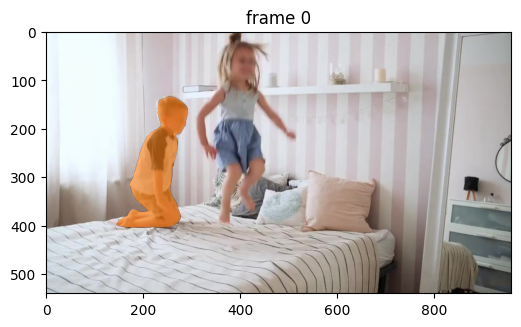

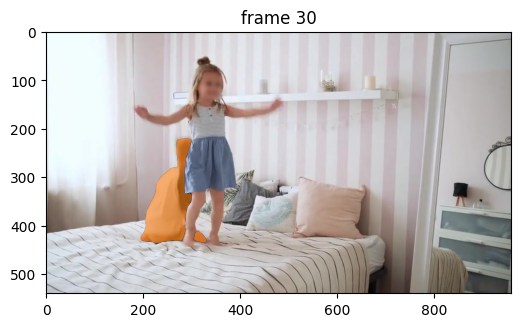

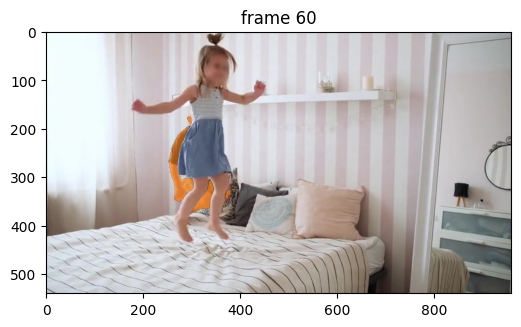

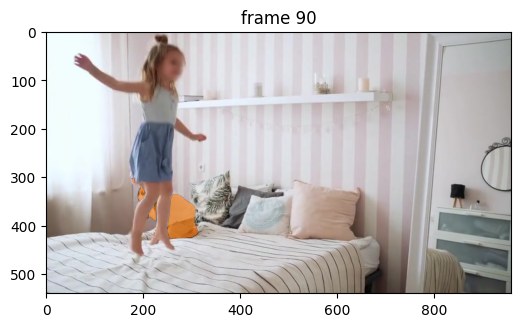

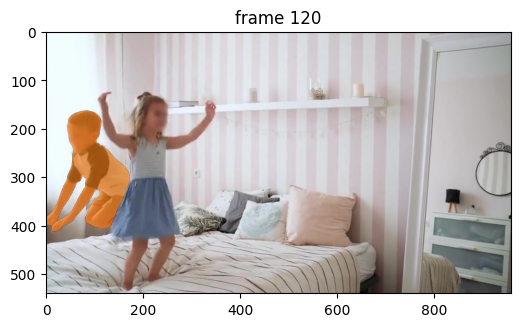

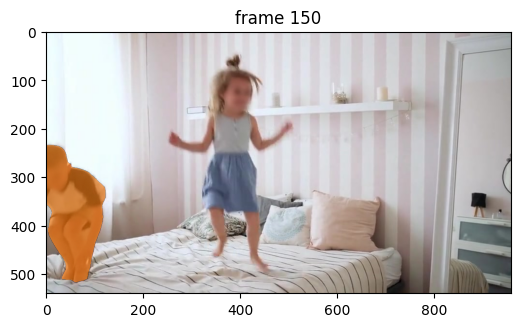

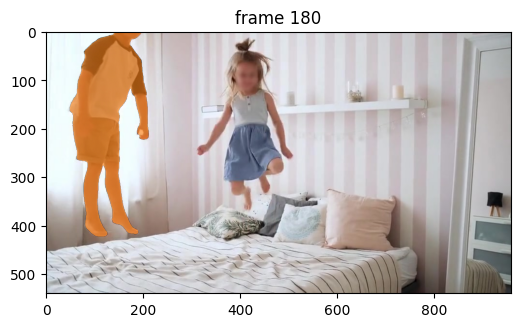

In [13]:
# run propagation throughout the video and collect the results in a dict
video_segments = {}  # video_segments contains the per-frame segmentation results
for out_frame_idx, out_obj_ids, out_mask_logits in predictor.propagate_in_video(inference_state):
    video_segments[out_frame_idx] = {
        out_obj_id: (out_mask_logits[i] > 0.0).cpu().numpy()
        for i, out_obj_id in enumerate(out_obj_ids)
    }

# render the segmentation results every few frames
vis_frame_stride = 30
plt.close("all")
for out_frame_idx in range(0, len(frame_names), vis_frame_stride):
    plt.figure(figsize=(6, 4))
    plt.title(f"frame {out_frame_idx}")
    plt.imshow(Image.open(os.path.join(video_dir, frame_names[out_frame_idx])))
    for out_obj_id, out_mask in video_segments[out_frame_idx].items():
        show_mask(out_mask, plt.gca(), obj_id=out_obj_id)

#### Step 4: Add new prompts to further refine the masklet

It appears that in the output masklet above, there are some small imperfections in boundary details on frame 150.

With SAM 2 we can fix the model predictions interactively. We can add a **negative click** at (x, y) = (82, 415) on this frame with label `0` to refine the masklet. Here we call the `add_new_points_or_box` API with a different `frame_idx` argument to indicate the frame index we want to refine.

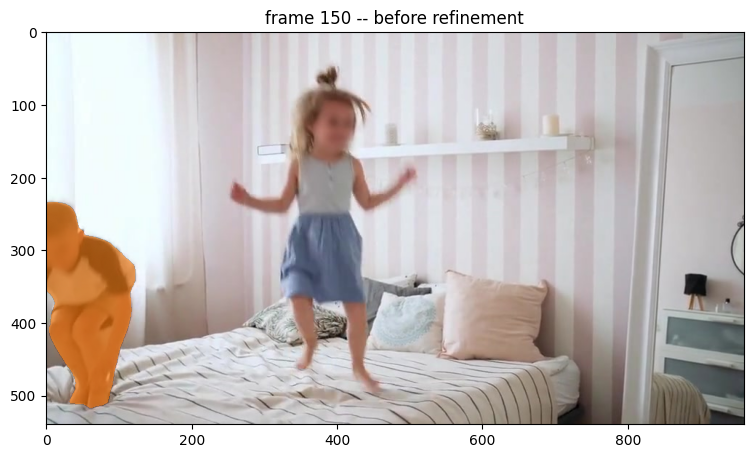

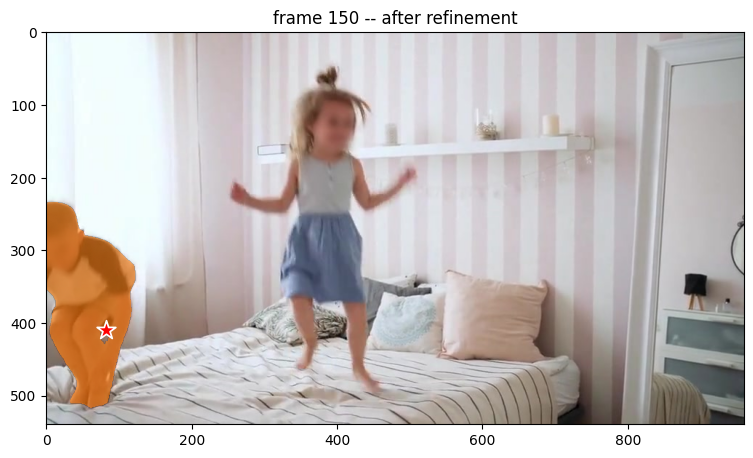

In [14]:
ann_frame_idx = 150  # further refine some details on this frame
ann_obj_id = 1  # give a unique id to the object we interact with (it can be any integers)

# show the segment before further refinement
plt.figure(figsize=(9, 6))
plt.title(f"frame {ann_frame_idx} -- before refinement")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[ann_frame_idx])))
show_mask(video_segments[ann_frame_idx][ann_obj_id], plt.gca(), obj_id=ann_obj_id)

# Let's add a negative click on this frame at (x, y) = (82, 415) to refine the segment
points = np.array([[82, 410]], dtype=np.float32)
# for labels, `1` means positive click and `0` means negative click
labels = np.array([0], np.int32)
_, _, out_mask_logits = predictor.add_new_points_or_box(
    inference_state=inference_state,
    frame_idx=ann_frame_idx,
    obj_id=ann_obj_id,
    points=points,
    labels=labels,
)

# show the segment after the further refinement
plt.figure(figsize=(9, 6))
plt.title(f"frame {ann_frame_idx} -- after refinement")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[ann_frame_idx])))
show_points(points, labels, plt.gca())
show_mask((out_mask_logits > 0.0).cpu().numpy(), plt.gca(), obj_id=ann_obj_id)

#### Step 5: Propagate the prompts (again) to get the masklet across the video

Let's get an updated masklet for the entire video. Here we call `propagate_in_video` again to propagate all the prompts after adding the new refinement click above.

propagate in video:   1%|          | 2/200 [00:00<00:29,  6.69it/s]

Processing frame 1 - Global MAD: 0.0292, Masked MAD: 0.1081


propagate in video:   2%|▏         | 3/200 [00:00<00:42,  4.69it/s]

Processing frame 2 - Global MAD: 0.0290, Masked MAD: 0.0827


propagate in video:   2%|▏         | 4/200 [00:00<00:49,  3.97it/s]

Processing frame 3 - Global MAD: 0.0303, Masked MAD: 0.0629


propagate in video:   2%|▎         | 5/200 [00:01<00:52,  3.68it/s]

Processing frame 4 - Global MAD: 0.0326, Masked MAD: 0.0612


propagate in video:   3%|▎         | 6/200 [00:01<00:55,  3.47it/s]

Processing frame 5 - Global MAD: 0.0269, Masked MAD: 0.0798


propagate in video:   4%|▎         | 7/200 [00:01<00:57,  3.33it/s]

Processing frame 6 - Global MAD: 0.0254, Masked MAD: 0.1029


propagate in video:   4%|▍         | 8/200 [00:02<00:59,  3.23it/s]

Processing frame 7 - Global MAD: 0.0298, Masked MAD: 0.1217


propagate in video:   4%|▍         | 9/200 [00:02<01:00,  3.15it/s]

Processing frame 8 - Global MAD: 0.0307, Masked MAD: 0.1450


propagate in video:   5%|▌         | 10/200 [00:02<01:01,  3.11it/s]

Processing frame 9 - Global MAD: 0.0292, Masked MAD: 0.1686


propagate in video:   6%|▌         | 11/200 [00:03<01:01,  3.10it/s]

Processing frame 10 - Global MAD: 0.0290, Masked MAD: 0.1859


propagate in video:   6%|▌         | 12/200 [00:03<01:01,  3.08it/s]

Processing frame 11 - Global MAD: 0.0281, Masked MAD: 0.1771


propagate in video:   6%|▋         | 13/200 [00:03<01:01,  3.06it/s]

Processing frame 12 - Global MAD: 0.0263, Masked MAD: 0.1475
Processing frame 13 - Global MAD: 0.0222, Masked MAD: 0.0630


propagate in video:   8%|▊         | 15/200 [00:04<01:00,  3.06it/s]

Processing frame 14 - Global MAD: 0.0241, Masked MAD: 0.1051


propagate in video:   8%|▊         | 16/200 [00:04<01:00,  3.06it/s]

Processing frame 15 - Global MAD: 0.0261, Masked MAD: 0.1339


propagate in video:   8%|▊         | 17/200 [00:05<00:59,  3.06it/s]

Processing frame 16 - Global MAD: 0.0267, Masked MAD: 0.1394


propagate in video:   9%|▉         | 18/200 [00:05<00:59,  3.05it/s]

Processing frame 17 - Global MAD: 0.0280, Masked MAD: 0.1477


propagate in video:  10%|▉         | 19/200 [00:05<00:59,  3.06it/s]

Processing frame 18 - Global MAD: 0.0275, Masked MAD: 0.1322


propagate in video:  10%|█         | 20/200 [00:06<00:58,  3.05it/s]

Processing frame 19 - Global MAD: 0.0266, Masked MAD: 0.1247
Processing frame 20 - Global MAD: 0.0268, Masked MAD: 0.1198


propagate in video:  10%|█         | 21/200 [00:06<00:58,  3.05it/s]

Processing frame 21 - Global MAD: 0.0260, Masked MAD: 0.1204


propagate in video:  11%|█         | 22/200 [00:06<00:58,  3.05it/s]

Processing frame 22 - Global MAD: 0.0203, Masked MAD: 0.0989


propagate in video:  12%|█▏        | 23/200 [00:07<00:58,  3.05it/s]

Processing frame 23 - Global MAD: 0.0163, Masked MAD: 0.0814


propagate in video:  12%|█▎        | 25/200 [00:07<00:57,  3.05it/s]

Processing frame 24 - Global MAD: 0.0182, Masked MAD: 0.0829


propagate in video:  13%|█▎        | 26/200 [00:08<00:57,  3.05it/s]

Processing frame 25 - Global MAD: 0.0212, Masked MAD: 0.0915


propagate in video:  14%|█▎        | 27/200 [00:08<00:56,  3.04it/s]

Processing frame 26 - Global MAD: 0.0195, Masked MAD: 0.1041
Processing frame 27 - Global MAD: 0.0205, Masked MAD: 0.1222


propagate in video:  14%|█▍        | 29/200 [00:09<00:56,  3.04it/s]

Processing frame 28 - Global MAD: 0.0173, Masked MAD: 0.1342


propagate in video:  15%|█▌        | 30/200 [00:09<00:55,  3.05it/s]

Processing frame 29 - Global MAD: 0.0182, Masked MAD: 0.1549


propagate in video:  16%|█▌        | 31/200 [00:09<00:55,  3.05it/s]

Processing frame 30 - Global MAD: 0.0176, Masked MAD: 0.1738
Avg FPS last 30 frames: 3.07
Processing frame 31 - Global MAD: 0.0212, Masked MAD: 0.1508


propagate in video:  16%|█▋        | 33/200 [00:10<00:54,  3.07it/s]

Processing frame 32 - Global MAD: 0.0192, Masked MAD: 0.0906
Processing frame 33 - Global MAD: 0.0205, Masked MAD: 0.0814


propagate in video:  17%|█▋        | 34/200 [00:10<00:53,  3.08it/s]

Processing frame 34 - Global MAD: 0.0229, Masked MAD: 0.1345


propagate in video:  18%|█▊        | 36/200 [00:11<00:53,  3.09it/s]

Processing frame 35 - Global MAD: 0.0215, Masked MAD: 0.1477
Processing frame 36 - Global MAD: 0.0195, Masked MAD: 0.1380


propagate in video:  19%|█▉        | 38/200 [00:12<00:53,  3.03it/s]

Processing frame 37 - Global MAD: 0.0197, Masked MAD: 0.1287


propagate in video:  20%|█▉        | 39/200 [00:12<00:52,  3.06it/s]

Processing frame 38 - Global MAD: 0.0242, Masked MAD: 0.1385


propagate in video:  20%|██        | 40/200 [00:12<00:51,  3.08it/s]

Processing frame 39 - Global MAD: 0.0245, Masked MAD: 0.1420
Processing frame 40 - Global MAD: 0.0226, Masked MAD: 0.1393


propagate in video:  20%|██        | 41/200 [00:13<00:51,  3.09it/s]

Processing frame 41 - Global MAD: 0.0183, Masked MAD: 0.1109


propagate in video:  22%|██▏       | 43/200 [00:13<00:50,  3.10it/s]

Processing frame 42 - Global MAD: 0.0145, Masked MAD: 0.0898


propagate in video:  22%|██▏       | 44/200 [00:13<00:50,  3.11it/s]

Processing frame 43 - Global MAD: 0.0136, Masked MAD: 0.0895
Processing frame 44 - Global MAD: 0.0135, Masked MAD: 0.0956


propagate in video:  23%|██▎       | 46/200 [00:14<00:49,  3.11it/s]

Processing frame 45 - Global MAD: 0.0140, Masked MAD: 0.0984
Processing frame 46 - Global MAD: 0.0154, Masked MAD: 0.1058


propagate in video:  24%|██▍       | 48/200 [00:15<00:48,  3.12it/s]

Processing frame 47 - Global MAD: 0.0161, Masked MAD: 0.1193


propagate in video:  24%|██▍       | 49/200 [00:15<00:48,  3.12it/s]

Processing frame 48 - Global MAD: 0.0170, Masked MAD: 0.1314


propagate in video:  25%|██▌       | 50/200 [00:15<00:48,  3.11it/s]

Processing frame 49 - Global MAD: 0.0187, Masked MAD: 0.1511


propagate in video:  26%|██▌       | 51/200 [00:16<00:47,  3.12it/s]

Processing frame 50 - Global MAD: 0.0204, Masked MAD: 0.1516


propagate in video:  26%|██▌       | 52/200 [00:16<00:47,  3.11it/s]

Processing frame 51 - Global MAD: 0.0227, Masked MAD: 0.1348
Processing frame 52 - Global MAD: 0.0193, Masked MAD: 0.0881


propagate in video:  27%|██▋       | 54/200 [00:17<00:46,  3.12it/s]

Processing frame 53 - Global MAD: 0.0178, Masked MAD: 0.1595
Processing frame 54 - Global MAD: 0.0248, Masked MAD: 0.1704


propagate in video:  28%|██▊       | 56/200 [00:17<00:46,  3.12it/s]

Processing frame 55 - Global MAD: 0.0251, Masked MAD: 0.1700


propagate in video:  28%|██▊       | 57/200 [00:18<00:45,  3.12it/s]

Processing frame 56 - Global MAD: 0.0233, Masked MAD: 0.1634
Processing frame 57 - Global MAD: 0.0208, Masked MAD: 0.1443


propagate in video:  30%|██▉       | 59/200 [00:18<00:45,  3.11it/s]

Processing frame 58 - Global MAD: 0.0205, Masked MAD: 0.1385


propagate in video:  30%|███       | 60/200 [00:19<00:44,  3.11it/s]

Processing frame 59 - Global MAD: 0.0184, Masked MAD: 0.1523


propagate in video:  30%|███       | 61/200 [00:19<00:44,  3.12it/s]

Processing frame 60 - Global MAD: 0.0154, Masked MAD: 0.1510
Avg FPS last 30 frames: 3.10


propagate in video:  31%|███       | 62/200 [00:19<00:44,  3.11it/s]

Processing frame 61 - Global MAD: 0.0164, Masked MAD: 0.1495
Processing frame 62 - Global MAD: 0.0173, Masked MAD: 0.1349


propagate in video:  32%|███▏      | 63/200 [00:20<00:43,  3.12it/s]

Processing frame 63 - Global MAD: 0.0188, Masked MAD: 0.1240


propagate in video:  32%|███▎      | 65/200 [00:20<00:43,  3.08it/s]

Processing frame 64 - Global MAD: 0.0192, Masked MAD: 0.1189


propagate in video:  33%|███▎      | 66/200 [00:21<00:43,  3.09it/s]

Processing frame 65 - Global MAD: 0.0199, Masked MAD: 0.1444


propagate in video:  34%|███▎      | 67/200 [00:21<00:42,  3.09it/s]

Processing frame 66 - Global MAD: 0.0209, Masked MAD: 0.1668


propagate in video:  34%|███▍      | 68/200 [00:21<00:42,  3.10it/s]

Processing frame 67 - Global MAD: 0.0216, Masked MAD: 0.1990


propagate in video:  34%|███▍      | 69/200 [00:22<00:42,  3.11it/s]

Processing frame 68 - Global MAD: 0.0171, Masked MAD: 0.2250


propagate in video:  35%|███▌      | 70/200 [00:22<00:41,  3.12it/s]

Processing frame 69 - Global MAD: 0.0203, Masked MAD: 0.2018


propagate in video:  36%|███▌      | 71/200 [00:22<00:41,  3.12it/s]

Processing frame 70 - Global MAD: 0.0227, Masked MAD: 0.1156


propagate in video:  36%|███▌      | 72/200 [00:22<00:40,  3.12it/s]

Processing frame 71 - Global MAD: 0.0205, Masked MAD: 0.0556
Processing frame 72 - Global MAD: 0.0246, Masked MAD: 0.1132


propagate in video:  37%|███▋      | 74/200 [00:23<00:40,  3.12it/s]

Processing frame 73 - Global MAD: 0.0249, Masked MAD: 0.1386
Processing frame 74 - Global MAD: 0.0213, Masked MAD: 0.1320


propagate in video:  38%|███▊      | 76/200 [00:24<00:39,  3.12it/s]

Processing frame 75 - Global MAD: 0.0201, Masked MAD: 0.1314
Processing frame 76 - Global MAD: 0.0162, Masked MAD: 0.1243


propagate in video:  38%|███▊      | 77/200 [00:24<00:39,  3.12it/s]

Processing frame 77 - Global MAD: 0.0162, Masked MAD: 0.1381


propagate in video:  39%|███▉      | 78/200 [00:24<00:39,  3.11it/s]

Processing frame 78 - Global MAD: 0.0184, Masked MAD: 0.1476


propagate in video:  40%|███▉      | 79/200 [00:25<00:38,  3.12it/s]

Processing frame 79 - Global MAD: 0.0201, Masked MAD: 0.1518


propagate in video:  40%|████      | 80/200 [00:25<00:38,  3.12it/s]

Processing frame 80 - Global MAD: 0.0208, Masked MAD: 0.1459


propagate in video:  40%|████      | 81/200 [00:25<00:38,  3.09it/s]

Processing frame 81 - Global MAD: 0.0207, Masked MAD: 0.1278


propagate in video:  41%|████      | 82/200 [00:26<00:38,  3.06it/s]

Processing frame 82 - Global MAD: 0.0224, Masked MAD: 0.0829


propagate in video:  42%|████▏     | 83/200 [00:26<00:38,  3.07it/s]

Processing frame 83 - Global MAD: 0.0240, Masked MAD: 0.0837


propagate in video:  42%|████▏     | 84/200 [00:26<00:38,  3.04it/s]

Processing frame 84 - Global MAD: 0.0255, Masked MAD: 0.0931


propagate in video:  42%|████▎     | 85/200 [00:27<00:37,  3.03it/s]

Processing frame 85 - Global MAD: 0.0187, Masked MAD: 0.0974


propagate in video:  43%|████▎     | 86/200 [00:27<00:37,  3.02it/s]

Processing frame 86 - Global MAD: 0.0244, Masked MAD: 0.1173


propagate in video:  44%|████▍     | 88/200 [00:28<00:37,  2.99it/s]

Processing frame 87 - Global MAD: 0.0281, Masked MAD: 0.0939
Processing frame 88 - Global MAD: 0.0267, Masked MAD: 0.1046


propagate in video:  44%|████▍     | 89/200 [00:28<00:37,  2.97it/s]

Processing frame 89 - Global MAD: 0.0253, Masked MAD: 0.0910


propagate in video:  46%|████▌     | 91/200 [00:29<00:36,  2.96it/s]

Processing frame 90 - Global MAD: 0.0238, Masked MAD: 0.0731
Avg FPS last 30 frames: 3.06


propagate in video:  46%|████▌     | 92/200 [00:29<00:30,  3.58it/s]

Skipping frame 91 - Global MAD: 0.0191, Masked MAD: 0.0512 (threshold: 0.05)
Processing frame 92 - Global MAD: 0.0285, Masked MAD: 0.1006


propagate in video:  46%|████▋     | 93/200 [00:29<00:31,  3.35it/s]

Processing frame 93 - Global MAD: 0.0206, Masked MAD: 0.1215


propagate in video:  47%|████▋     | 94/200 [00:30<00:32,  3.23it/s]

Processing frame 94 - Global MAD: 0.0202, Masked MAD: 0.1216


propagate in video:  48%|████▊     | 95/200 [00:30<00:33,  3.16it/s]

Processing frame 95 - Global MAD: 0.0213, Masked MAD: 0.1413


propagate in video:  48%|████▊     | 96/200 [00:30<00:33,  3.09it/s]

Processing frame 96 - Global MAD: 0.0229, Masked MAD: 0.1308


propagate in video:  48%|████▊     | 97/200 [00:31<00:33,  3.06it/s]

Processing frame 97 - Global MAD: 0.0232, Masked MAD: 0.1039


propagate in video:  50%|████▉     | 99/200 [00:31<00:33,  3.03it/s]

Processing frame 98 - Global MAD: 0.0229, Masked MAD: 0.1280
Processing frame 99 - Global MAD: 0.0237, Masked MAD: 0.1219


propagate in video:  50%|█████     | 101/200 [00:32<00:32,  3.03it/s]

Processing frame 100 - Global MAD: 0.0265, Masked MAD: 0.1401
Processing frame 101 - Global MAD: 0.0254, Masked MAD: 0.1459


propagate in video:  52%|█████▏    | 103/200 [00:33<00:31,  3.04it/s]

Processing frame 102 - Global MAD: 0.0173, Masked MAD: 0.1175
Processing frame 103 - Global MAD: 0.0265, Masked MAD: 0.1793


propagate in video:  52%|█████▏    | 104/200 [00:33<00:31,  3.04it/s]

Processing frame 104 - Global MAD: 0.0274, Masked MAD: 0.1678


propagate in video:  53%|█████▎    | 106/200 [00:34<00:31,  3.01it/s]

Processing frame 105 - Global MAD: 0.0279, Masked MAD: 0.1510


propagate in video:  54%|█████▎    | 107/200 [00:34<00:30,  3.02it/s]

Processing frame 106 - Global MAD: 0.0287, Masked MAD: 0.1955


propagate in video:  54%|█████▍    | 108/200 [00:34<00:30,  2.99it/s]

Processing frame 107 - Global MAD: 0.0279, Masked MAD: 0.1969


propagate in video:  55%|█████▍    | 109/200 [00:35<00:31,  2.90it/s]

Processing frame 108 - Global MAD: 0.0253, Masked MAD: 0.1788


propagate in video:  55%|█████▌    | 110/200 [00:35<00:30,  2.92it/s]

Processing frame 109 - Global MAD: 0.0211, Masked MAD: 0.1126
Processing frame 110 - Global MAD: 0.0206, Masked MAD: 0.1023


propagate in video:  56%|█████▌    | 111/200 [00:35<00:30,  2.90it/s]

Processing frame 111 - Global MAD: 0.0226, Masked MAD: 0.1480


propagate in video:  56%|█████▌    | 112/200 [00:36<00:30,  2.90it/s]

Processing frame 112 - Global MAD: 0.0229, Masked MAD: 0.1639


propagate in video:  56%|█████▋    | 113/200 [00:36<00:29,  2.90it/s]

Processing frame 113 - Global MAD: 0.0239, Masked MAD: 0.1638


propagate in video:  57%|█████▋    | 114/200 [00:36<00:29,  2.91it/s]

Processing frame 114 - Global MAD: 0.0286, Masked MAD: 0.1658


propagate in video:  58%|█████▊    | 116/200 [00:37<00:28,  2.92it/s]

Processing frame 115 - Global MAD: 0.0308, Masked MAD: 0.1597
Processing frame 116 - Global MAD: 0.0301, Masked MAD: 0.1633


propagate in video:  59%|█████▉    | 118/200 [00:38<00:27,  2.93it/s]

Processing frame 117 - Global MAD: 0.0297, Masked MAD: 0.1461
Processing frame 118 - Global MAD: 0.0315, Masked MAD: 0.1420


propagate in video:  60%|█████▉    | 119/200 [00:38<00:27,  2.93it/s]

Processing frame 119 - Global MAD: 0.0323, Masked MAD: 0.1189


propagate in video:  60%|██████    | 121/200 [00:39<00:27,  2.90it/s]

Processing frame 120 - Global MAD: 0.0249, Masked MAD: 0.1163
Avg FPS last 30 frames: 3.01


propagate in video:  61%|██████    | 122/200 [00:39<00:26,  2.89it/s]

Processing frame 121 - Global MAD: 0.0319, Masked MAD: 0.1365


propagate in video:  62%|██████▏   | 123/200 [00:39<00:26,  2.91it/s]

Processing frame 122 - Global MAD: 0.0348, Masked MAD: 0.1558


propagate in video:  62%|██████▏   | 124/200 [00:40<00:26,  2.92it/s]

Processing frame 123 - Global MAD: 0.0364, Masked MAD: 0.1643


propagate in video:  62%|██████▎   | 125/200 [00:40<00:25,  2.93it/s]

Processing frame 124 - Global MAD: 0.0357, Masked MAD: 0.1846


propagate in video:  63%|██████▎   | 126/200 [00:40<00:25,  2.93it/s]

Processing frame 125 - Global MAD: 0.0363, Masked MAD: 0.1945


propagate in video:  64%|██████▎   | 127/200 [00:41<00:24,  2.94it/s]

Processing frame 126 - Global MAD: 0.0363, Masked MAD: 0.1706


propagate in video:  64%|██████▍   | 128/200 [00:41<00:24,  2.95it/s]

Processing frame 127 - Global MAD: 0.0325, Masked MAD: 0.1035


propagate in video:  64%|██████▍   | 129/200 [00:41<00:24,  2.95it/s]

Processing frame 128 - Global MAD: 0.0289, Masked MAD: 0.0647


propagate in video:  65%|██████▌   | 130/200 [00:42<00:23,  2.95it/s]

Processing frame 129 - Global MAD: 0.0308, Masked MAD: 0.1184
Processing frame 130 - Global MAD: 0.0317, Masked MAD: 0.1291


propagate in video:  66%|██████▌   | 131/200 [00:42<00:23,  2.93it/s]

Processing frame 131 - Global MAD: 0.0350, Masked MAD: 0.1323


propagate in video:  66%|██████▌   | 132/200 [00:42<00:23,  2.94it/s]

Processing frame 132 - Global MAD: 0.0359, Masked MAD: 0.1296


propagate in video:  67%|██████▋   | 134/200 [00:43<00:22,  2.91it/s]

Processing frame 133 - Global MAD: 0.0360, Masked MAD: 0.1169


propagate in video:  68%|██████▊   | 135/200 [00:43<00:22,  2.92it/s]

Processing frame 134 - Global MAD: 0.0360, Masked MAD: 0.0933


propagate in video:  68%|██████▊   | 136/200 [00:44<00:21,  2.94it/s]

Processing frame 135 - Global MAD: 0.0347, Masked MAD: 0.0641


propagate in video:  68%|██████▊   | 137/200 [00:44<00:21,  2.95it/s]

Processing frame 136 - Global MAD: 0.0360, Masked MAD: 0.0638


propagate in video:  69%|██████▉   | 138/200 [00:44<00:21,  2.94it/s]

Processing frame 137 - Global MAD: 0.0337, Masked MAD: 0.0949


propagate in video:  70%|██████▉   | 139/200 [00:45<00:20,  2.94it/s]

Processing frame 138 - Global MAD: 0.0290, Masked MAD: 0.1174


propagate in video:  70%|███████   | 140/200 [00:45<00:20,  2.94it/s]

Processing frame 139 - Global MAD: 0.0340, Masked MAD: 0.1351


propagate in video:  70%|███████   | 141/200 [00:46<00:19,  2.96it/s]

Processing frame 140 - Global MAD: 0.0359, Masked MAD: 0.1575
Processing frame 141 - Global MAD: 0.0376, Masked MAD: 0.1700


propagate in video:  71%|███████   | 142/200 [00:46<00:19,  2.96it/s]

Processing frame 142 - Global MAD: 0.0394, Masked MAD: 0.1685


propagate in video:  72%|███████▏  | 144/200 [00:47<00:18,  2.96it/s]

Processing frame 143 - Global MAD: 0.0375, Masked MAD: 0.1614


propagate in video:  72%|███████▎  | 145/200 [00:47<00:18,  2.96it/s]

Processing frame 144 - Global MAD: 0.0355, Masked MAD: 0.1479


propagate in video:  73%|███████▎  | 146/200 [00:47<00:18,  2.97it/s]

Processing frame 145 - Global MAD: 0.0304, Masked MAD: 0.0899


propagate in video:  74%|███████▎  | 147/200 [00:48<00:18,  2.91it/s]

Processing frame 146 - Global MAD: 0.0294, Masked MAD: 0.0620


propagate in video:  74%|███████▍  | 148/200 [00:48<00:17,  2.91it/s]

Processing frame 147 - Global MAD: 0.0321, Masked MAD: 0.1146


propagate in video:  74%|███████▍  | 149/200 [00:48<00:17,  2.92it/s]

Processing frame 148 - Global MAD: 0.0341, Masked MAD: 0.1111


propagate in video:  75%|███████▌  | 150/200 [00:49<00:16,  2.94it/s]

Processing frame 149 - Global MAD: 0.0373, Masked MAD: 0.1144


propagate in video:  76%|███████▌  | 151/200 [00:49<00:16,  2.92it/s]

Processing frame 150 - Global MAD: 0.0396, Masked MAD: 0.1215
Avg FPS last 30 frames: 2.94


propagate in video:  76%|███████▌  | 152/200 [00:49<00:16,  2.93it/s]

Processing frame 151 - Global MAD: 0.0410, Masked MAD: 0.1316


propagate in video:  76%|███████▋  | 153/200 [00:50<00:16,  2.93it/s]

Processing frame 152 - Global MAD: 0.0424, Masked MAD: 0.1285
Processing frame 153 - Global MAD: 0.0442, Masked MAD: 0.1315


propagate in video:  78%|███████▊  | 155/200 [00:50<00:15,  2.96it/s]

Processing frame 154 - Global MAD: 0.0385, Masked MAD: 0.1312


propagate in video:  78%|███████▊  | 156/200 [00:51<00:14,  2.97it/s]

Processing frame 155 - Global MAD: 0.0410, Masked MAD: 0.1324


propagate in video:  78%|███████▊  | 157/200 [00:51<00:14,  2.97it/s]

Processing frame 156 - Global MAD: 0.0452, Masked MAD: 0.1305


propagate in video:  79%|███████▉  | 158/200 [00:51<00:14,  2.91it/s]

Processing frame 157 - Global MAD: 0.0453, Masked MAD: 0.1164


propagate in video:  80%|███████▉  | 159/200 [00:52<00:14,  2.92it/s]

Processing frame 158 - Global MAD: 0.0440, Masked MAD: 0.1060


propagate in video:  80%|████████  | 160/200 [00:52<00:13,  2.92it/s]

Processing frame 159 - Global MAD: 0.0383, Masked MAD: 0.0972
Processing frame 160 - Global MAD: 0.0331, Masked MAD: 0.0826


propagate in video:  81%|████████  | 162/200 [00:53<00:12,  2.94it/s]

Processing frame 161 - Global MAD: 0.0285, Masked MAD: 0.0729


propagate in video:  82%|████████▏ | 163/200 [00:53<00:12,  2.95it/s]

Processing frame 162 - Global MAD: 0.0282, Masked MAD: 0.0733


propagate in video:  82%|████████▏ | 164/200 [00:53<00:12,  2.96it/s]

Processing frame 163 - Global MAD: 0.0268, Masked MAD: 0.0866


propagate in video:  82%|████████▎ | 165/200 [00:54<00:11,  2.95it/s]

Processing frame 164 - Global MAD: 0.0309, Masked MAD: 0.1041
Processing frame 165 - Global MAD: 0.0358, Masked MAD: 0.1217


propagate in video:  83%|████████▎ | 166/200 [00:54<00:11,  2.94it/s]

Processing frame 166 - Global MAD: 0.0369, Masked MAD: 0.1361


propagate in video:  84%|████████▎ | 167/200 [00:54<00:11,  2.91it/s]

Processing frame 167 - Global MAD: 0.0387, Masked MAD: 0.1460


propagate in video:  84%|████████▍ | 168/200 [00:55<00:11,  2.89it/s]

Processing frame 168 - Global MAD: 0.0383, Masked MAD: 0.1368


propagate in video:  85%|████████▌ | 170/200 [00:55<00:11,  2.72it/s]

Processing frame 169 - Global MAD: 0.0336, Masked MAD: 0.0972
Processing frame 170 - Global MAD: 0.0312, Masked MAD: 0.0880


propagate in video:  86%|████████▌ | 171/200 [00:56<00:11,  2.60it/s]

Processing frame 171 - Global MAD: 0.0327, Masked MAD: 0.1254


propagate in video:  86%|████████▌ | 172/200 [00:56<00:10,  2.66it/s]

Processing frame 172 - Global MAD: 0.0373, Masked MAD: 0.1352


propagate in video:  86%|████████▋ | 173/200 [00:57<00:09,  2.71it/s]

Processing frame 173 - Global MAD: 0.0375, Masked MAD: 0.1317


propagate in video:  87%|████████▋ | 174/200 [00:57<00:09,  2.66it/s]

Processing frame 174 - Global MAD: 0.0365, Masked MAD: 0.1262


propagate in video:  88%|████████▊ | 175/200 [00:57<00:09,  2.68it/s]

Processing frame 175 - Global MAD: 0.0309, Masked MAD: 0.1148


propagate in video:  88%|████████▊ | 177/200 [00:58<00:08,  2.62it/s]

Processing frame 176 - Global MAD: 0.0304, Masked MAD: 0.1037
Processing frame 177 - Global MAD: 0.0253, Masked MAD: 0.0881


propagate in video:  89%|████████▉ | 178/200 [00:59<00:08,  2.70it/s]

Processing frame 178 - Global MAD: 0.0203, Masked MAD: 0.0720


propagate in video:  90%|█████████ | 180/200 [00:59<00:07,  2.79it/s]

Processing frame 179 - Global MAD: 0.0197, Masked MAD: 0.0672


propagate in video:  90%|█████████ | 181/200 [01:00<00:06,  2.76it/s]

Processing frame 180 - Global MAD: 0.0220, Masked MAD: 0.0750
Avg FPS last 30 frames: 2.82


propagate in video:  91%|█████████ | 182/200 [01:00<00:06,  2.80it/s]

Processing frame 181 - Global MAD: 0.0245, Masked MAD: 0.0980
Processing frame 182 - Global MAD: 0.0291, Masked MAD: 0.1150


propagate in video:  92%|█████████▏| 184/200 [01:01<00:05,  2.82it/s]

Processing frame 183 - Global MAD: 0.0329, Masked MAD: 0.1245


propagate in video:  92%|█████████▎| 185/200 [01:01<00:05,  2.84it/s]

Processing frame 184 - Global MAD: 0.0378, Masked MAD: 0.1443


propagate in video:  93%|█████████▎| 186/200 [01:01<00:04,  2.88it/s]

Processing frame 185 - Global MAD: 0.0434, Masked MAD: 0.1947


propagate in video:  94%|█████████▎| 187/200 [01:02<00:04,  2.87it/s]

Processing frame 186 - Global MAD: 0.0461, Masked MAD: 0.2162


propagate in video:  94%|█████████▍| 188/200 [01:02<00:04,  2.88it/s]

Processing frame 187 - Global MAD: 0.0440, Masked MAD: 0.2036
Processing frame 188 - Global MAD: 0.0401, Masked MAD: 0.1870


propagate in video:  95%|█████████▌| 190/200 [01:03<00:03,  2.90it/s]

Processing frame 189 - Global MAD: 0.0323, Masked MAD: 0.1268


propagate in video:  96%|█████████▌| 191/200 [01:03<00:03,  2.91it/s]

Processing frame 190 - Global MAD: 0.0310, Masked MAD: 0.0826
Processing frame 191 - Global MAD: 0.0398, Masked MAD: 0.1403


propagate in video:  96%|█████████▌| 192/200 [01:03<00:02,  2.93it/s]

Processing frame 192 - Global MAD: 0.0407, Masked MAD: 0.1288


propagate in video:  96%|█████████▋| 193/200 [01:04<00:02,  2.90it/s]

Processing frame 193 - Global MAD: 0.0381, Masked MAD: 0.1309


propagate in video:  98%|█████████▊| 195/200 [01:04<00:01,  2.89it/s]

Processing frame 194 - Global MAD: 0.0357, Masked MAD: 0.1289


propagate in video:  98%|█████████▊| 196/200 [01:05<00:01,  2.86it/s]

Processing frame 195 - Global MAD: 0.0337, Masked MAD: 0.1251


propagate in video:  98%|█████████▊| 197/200 [01:05<00:01,  2.91it/s]

Processing frame 196 - Global MAD: 0.0312, Masked MAD: 0.1172


propagate in video:  99%|█████████▉| 198/200 [01:05<00:00,  2.93it/s]

Processing frame 197 - Global MAD: 0.0299, Masked MAD: 0.1048


propagate in video: 100%|█████████▉| 199/200 [01:06<00:00,  2.95it/s]

Processing frame 198 - Global MAD: 0.0299, Masked MAD: 0.0881


propagate in video: 100%|██████████| 200/200 [01:06<00:00,  2.96it/s]

Processing frame 199 - Global MAD: 0.0280, Masked MAD: 0.0664


propagate in video: 100%|██████████| 200/200 [01:06<00:00,  3.00it/s]


Skipped 1 frames due to low MAD.


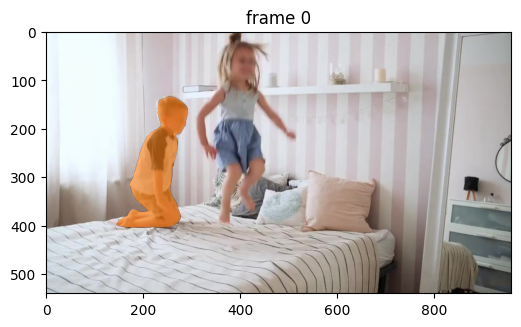

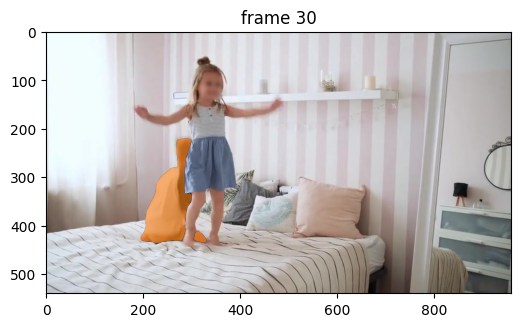

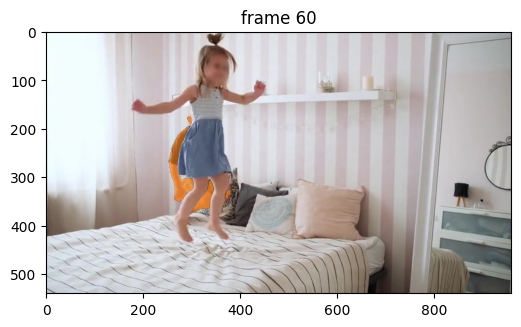

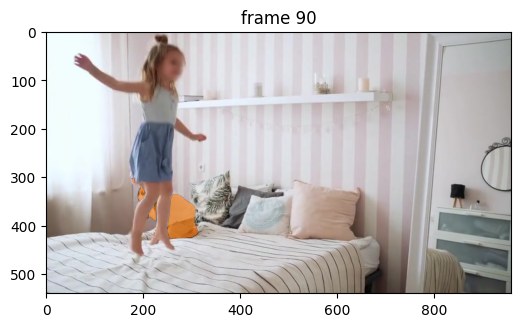

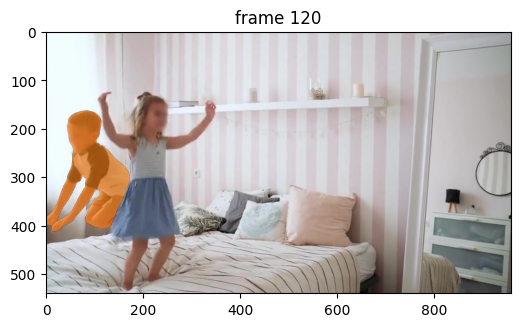

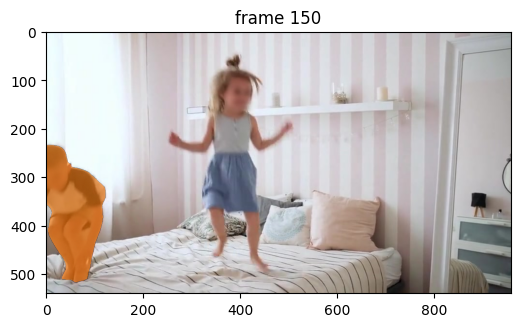

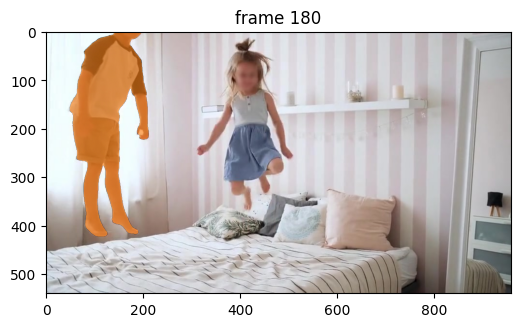

In [15]:
# run propagation throughout the video and collect the results in a dict
video_segments = {}  # video_segments contains the per-frame segmentation results
for out_frame_idx, out_obj_ids, out_mask_logits in predictor.propagate_in_video(inference_state):
    video_segments[out_frame_idx] = {
        out_obj_id: (out_mask_logits[i] > 0.0).cpu().numpy()
        for i, out_obj_id in enumerate(out_obj_ids)
    }

# render the segmentation results every few frames
vis_frame_stride = 30
plt.close("all")
for out_frame_idx in range(0, len(frame_names), vis_frame_stride):
    plt.figure(figsize=(6, 4))
    plt.title(f"frame {out_frame_idx}")
    plt.imshow(Image.open(os.path.join(video_dir, frame_names[out_frame_idx])))
    for out_obj_id, out_mask in video_segments[out_frame_idx].items():
        show_mask(out_mask, plt.gca(), obj_id=out_obj_id)

The segments now look good on all frames.

### Example 2: Segment an object using box prompt

Note: if you have run any previous tracking using this `inference_state`, please reset it first via `reset_state`.

In [16]:
predictor.reset_state(inference_state)

In addition to using clicks as inputs, SAM 2 also supports segmenting and tracking objects in a video via **bounding boxes**.

In the example below, we segment the child on the right using a **box prompt** of (x_min, y_min, x_max, y_max) = (300, 0, 500, 400) on frame 0 as input into the `add_new_points_or_box` API.

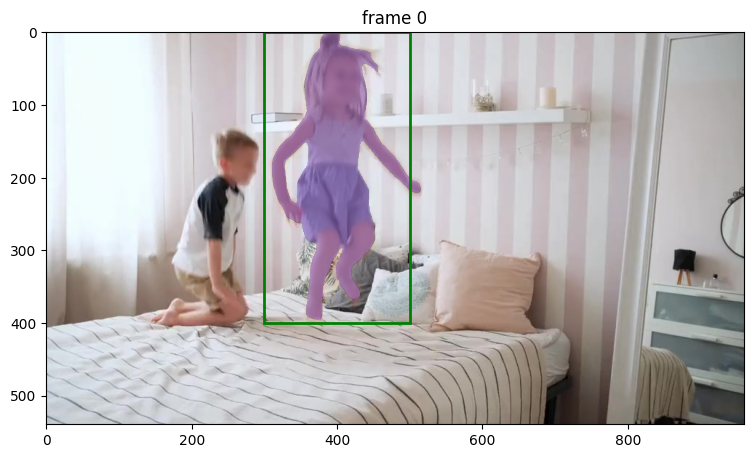

In [17]:
ann_frame_idx = 0  # the frame index we interact with
ann_obj_id = 4  # give a unique id to each object we interact with (it can be any integers)

# Let's add a box at (x_min, y_min, x_max, y_max) = (300, 0, 500, 400) to get started
box = np.array([300, 0, 500, 400], dtype=np.float32)
_, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
    inference_state=inference_state,
    frame_idx=ann_frame_idx,
    obj_id=ann_obj_id,
    box=box,
)

# show the results on the current (interacted) frame
plt.figure(figsize=(9, 6))
plt.title(f"frame {ann_frame_idx}")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[ann_frame_idx])))
show_box(box, plt.gca())
show_mask((out_mask_logits[0] > 0.0).cpu().numpy(), plt.gca(), obj_id=out_obj_ids[0])

Here, SAM 2 gets a pretty good segmentation mask of the entire child, even though the input bounding box is not perfectly tight around the object.

Similar to the previous example, if the returned mask from is not perfect when using a box prompt, we can also further **refine** the output using positive or negative clicks. To illustrate this, here we make a **positive click** at (x, y) = (460, 60) with label `1` to expand the segment around the child's hair.

Note: to refine the segmentation mask from a box prompt, we need to send **both the original box input and all subsequent refinement clicks and their labels** when calling `add_new_points_or_box`.

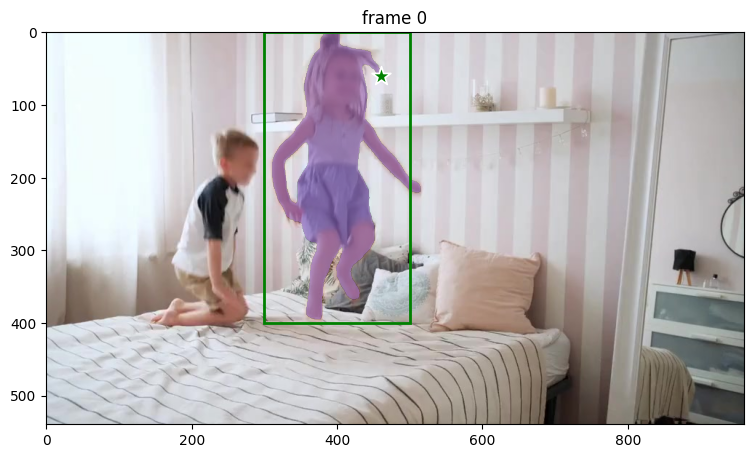

In [18]:
ann_frame_idx = 0  # the frame index we interact with
ann_obj_id = 4  # give a unique id to each object we interact with (it can be any integers)

# Let's add a positive click at (x, y) = (460, 60) to refine the mask
points = np.array([[460, 60]], dtype=np.float32)
# for labels, `1` means positive click and `0` means negative click
labels = np.array([1], np.int32)
# note that we also need to send the original box input along with
# the new refinement click together into `add_new_points_or_box`
box = np.array([300, 0, 500, 400], dtype=np.float32)
_, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
    inference_state=inference_state,
    frame_idx=ann_frame_idx,
    obj_id=ann_obj_id,
    points=points,
    labels=labels,
    box=box,
)

# show the results on the current (interacted) frame
plt.figure(figsize=(9, 6))
plt.title(f"frame {ann_frame_idx}")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[ann_frame_idx])))
show_box(box, plt.gca())
show_points(points, labels, plt.gca())
show_mask((out_mask_logits[0] > 0.0).cpu().numpy(), plt.gca(), obj_id=out_obj_ids[0])

Then, to get the masklet throughout the entire video, we propagate the prompts using the `propagate_in_video` API.

propagate in video:   1%|          | 2/200 [00:00<00:37,  5.24it/s]

Processing frame 1 - Global MAD: 0.0292, Masked MAD: 0.1367


propagate in video:   2%|▏         | 3/200 [00:00<00:51,  3.82it/s]

Processing frame 2 - Global MAD: 0.0290, Masked MAD: 0.1380
Processing frame 3 - Global MAD: 0.0303, Masked MAD: 0.1390


propagate in video:   2%|▎         | 5/200 [00:01<01:04,  3.04it/s]

Processing frame 4 - Global MAD: 0.0326, Masked MAD: 0.1397
Processing frame 5 - Global MAD: 0.0269, Masked MAD: 0.1032


propagate in video:   3%|▎         | 6/200 [00:01<01:05,  2.94it/s]

Processing frame 6 - Global MAD: 0.0254, Masked MAD: 0.0917


propagate in video:   4%|▎         | 7/200 [00:02<01:07,  2.86it/s]

Processing frame 7 - Global MAD: 0.0298, Masked MAD: 0.1107


propagate in video:   4%|▍         | 8/200 [00:02<01:08,  2.79it/s]

Processing frame 8 - Global MAD: 0.0307, Masked MAD: 0.1127


propagate in video:   4%|▍         | 9/200 [00:02<01:07,  2.82it/s]

Processing frame 9 - Global MAD: 0.0292, Masked MAD: 0.1066


propagate in video:   5%|▌         | 10/200 [00:03<01:08,  2.77it/s]

Processing frame 10 - Global MAD: 0.0290, Masked MAD: 0.0963


propagate in video:   6%|▌         | 12/200 [00:04<01:09,  2.71it/s]

Processing frame 11 - Global MAD: 0.0281, Masked MAD: 0.0853
Processing frame 12 - Global MAD: 0.0263, Masked MAD: 0.0861


propagate in video:   6%|▋         | 13/200 [00:04<01:09,  2.69it/s]

Processing frame 13 - Global MAD: 0.0222, Masked MAD: 0.0861


propagate in video:   7%|▋         | 14/200 [00:04<01:09,  2.67it/s]

Processing frame 14 - Global MAD: 0.0241, Masked MAD: 0.0878


propagate in video:   8%|▊         | 15/200 [00:05<01:09,  2.66it/s]

Processing frame 15 - Global MAD: 0.0261, Masked MAD: 0.0941


propagate in video:   8%|▊         | 17/200 [00:05<01:09,  2.63it/s]

Processing frame 16 - Global MAD: 0.0267, Masked MAD: 0.0999
Processing frame 17 - Global MAD: 0.0280, Masked MAD: 0.1088


propagate in video:   9%|▉         | 18/200 [00:06<01:09,  2.64it/s]

Processing frame 18 - Global MAD: 0.0275, Masked MAD: 0.1216


propagate in video:  10%|▉         | 19/200 [00:06<01:08,  2.64it/s]

Processing frame 19 - Global MAD: 0.0266, Masked MAD: 0.1236


propagate in video:  10%|█         | 20/200 [00:07<01:08,  2.64it/s]

Processing frame 20 - Global MAD: 0.0268, Masked MAD: 0.1278


propagate in video:  10%|█         | 21/200 [00:07<01:08,  2.63it/s]

Processing frame 21 - Global MAD: 0.0260, Masked MAD: 0.1229


propagate in video:  11%|█         | 22/200 [00:07<01:08,  2.61it/s]

Processing frame 22 - Global MAD: 0.0203, Masked MAD: 0.0933


propagate in video:  12%|█▏        | 23/200 [00:08<01:07,  2.61it/s]

Processing frame 23 - Global MAD: 0.0163, Masked MAD: 0.0798


propagate in video:  12%|█▏        | 24/200 [00:08<01:06,  2.63it/s]

Processing frame 24 - Global MAD: 0.0182, Masked MAD: 0.0911


propagate in video:  12%|█▎        | 25/200 [00:09<01:08,  2.56it/s]

Processing frame 25 - Global MAD: 0.0212, Masked MAD: 0.1044


propagate in video:  13%|█▎        | 26/200 [00:09<01:07,  2.59it/s]

Processing frame 26 - Global MAD: 0.0195, Masked MAD: 0.0963


propagate in video:  14%|█▎        | 27/200 [00:09<01:08,  2.54it/s]

Processing frame 27 - Global MAD: 0.0205, Masked MAD: 0.0872


propagate in video:  14%|█▍        | 28/200 [00:10<01:07,  2.56it/s]

Processing frame 28 - Global MAD: 0.0173, Masked MAD: 0.0684


propagate in video:  14%|█▍        | 29/200 [00:10<01:06,  2.59it/s]

Processing frame 29 - Global MAD: 0.0182, Masked MAD: 0.0686


propagate in video:  15%|█▌        | 30/200 [00:10<01:05,  2.58it/s]

Processing frame 30 - Global MAD: 0.0176, Masked MAD: 0.0743


propagate in video:  16%|█▌        | 31/200 [00:11<01:04,  2.61it/s]

Avg FPS last 30 frames: 2.64
Processing frame 31 - Global MAD: 0.0212, Masked MAD: 0.0876


propagate in video:  16%|█▌        | 32/200 [00:11<01:04,  2.60it/s]

Processing frame 32 - Global MAD: 0.0192, Masked MAD: 0.1007


propagate in video:  16%|█▋        | 33/200 [00:12<01:05,  2.55it/s]

Processing frame 33 - Global MAD: 0.0205, Masked MAD: 0.1106


propagate in video:  17%|█▋        | 34/200 [00:12<01:07,  2.47it/s]

Processing frame 34 - Global MAD: 0.0229, Masked MAD: 0.1150


propagate in video:  18%|█▊        | 35/200 [00:13<01:09,  2.39it/s]

Processing frame 35 - Global MAD: 0.0215, Masked MAD: 0.0984


propagate in video:  18%|█▊        | 36/200 [00:13<01:08,  2.38it/s]

Processing frame 36 - Global MAD: 0.0195, Masked MAD: 0.0772


propagate in video:  18%|█▊        | 37/200 [00:13<01:08,  2.38it/s]

Processing frame 37 - Global MAD: 0.0197, Masked MAD: 0.0887


propagate in video:  19%|█▉        | 38/200 [00:14<01:09,  2.34it/s]

Processing frame 38 - Global MAD: 0.0242, Masked MAD: 0.1170


propagate in video:  20%|█▉        | 39/200 [00:14<01:09,  2.33it/s]

Processing frame 39 - Global MAD: 0.0245, Masked MAD: 0.1215


propagate in video:  20%|██        | 40/200 [00:15<01:06,  2.41it/s]

Processing frame 40 - Global MAD: 0.0226, Masked MAD: 0.1191


propagate in video:  20%|██        | 41/200 [00:15<01:04,  2.45it/s]

Processing frame 41 - Global MAD: 0.0183, Masked MAD: 0.1030


propagate in video:  21%|██        | 42/200 [00:15<01:03,  2.50it/s]

Processing frame 42 - Global MAD: 0.0145, Masked MAD: 0.0886


propagate in video:  22%|██▏       | 43/200 [00:16<01:02,  2.52it/s]

Processing frame 43 - Global MAD: 0.0136, Masked MAD: 0.0760


propagate in video:  22%|██▏       | 44/200 [00:16<01:01,  2.53it/s]

Processing frame 44 - Global MAD: 0.0135, Masked MAD: 0.0714


propagate in video:  22%|██▎       | 45/200 [00:17<01:00,  2.56it/s]

Processing frame 45 - Global MAD: 0.0140, Masked MAD: 0.0698


propagate in video:  23%|██▎       | 46/200 [00:17<00:59,  2.57it/s]

Processing frame 46 - Global MAD: 0.0154, Masked MAD: 0.0859


propagate in video:  24%|██▎       | 47/200 [00:17<01:02,  2.46it/s]

Processing frame 47 - Global MAD: 0.0161, Masked MAD: 0.1001


propagate in video:  24%|██▍       | 48/200 [00:18<01:02,  2.45it/s]

Processing frame 48 - Global MAD: 0.0170, Masked MAD: 0.1089


propagate in video:  24%|██▍       | 49/200 [00:18<01:00,  2.48it/s]

Processing frame 49 - Global MAD: 0.0187, Masked MAD: 0.1078


propagate in video:  25%|██▌       | 50/200 [00:19<01:00,  2.49it/s]

Processing frame 50 - Global MAD: 0.0204, Masked MAD: 0.1106


propagate in video:  26%|██▌       | 51/200 [00:19<01:00,  2.45it/s]

Processing frame 51 - Global MAD: 0.0227, Masked MAD: 0.1051


propagate in video:  26%|██▌       | 52/200 [00:19<00:59,  2.47it/s]

Processing frame 52 - Global MAD: 0.0193, Masked MAD: 0.0920


propagate in video:  26%|██▋       | 53/200 [00:20<00:59,  2.48it/s]

Processing frame 53 - Global MAD: 0.0178, Masked MAD: 0.0786


propagate in video:  27%|██▋       | 54/200 [00:20<00:58,  2.49it/s]

Processing frame 54 - Global MAD: 0.0248, Masked MAD: 0.1110


propagate in video:  28%|██▊       | 55/200 [00:21<00:57,  2.50it/s]

Processing frame 55 - Global MAD: 0.0251, Masked MAD: 0.1156


propagate in video:  28%|██▊       | 56/200 [00:21<00:57,  2.49it/s]

Processing frame 56 - Global MAD: 0.0233, Masked MAD: 0.1154


propagate in video:  28%|██▊       | 57/200 [00:21<00:57,  2.51it/s]

Processing frame 57 - Global MAD: 0.0208, Masked MAD: 0.1060


propagate in video:  29%|██▉       | 58/200 [00:22<00:56,  2.53it/s]

Processing frame 58 - Global MAD: 0.0205, Masked MAD: 0.1019


propagate in video:  30%|██▉       | 59/200 [00:22<00:56,  2.51it/s]

Processing frame 59 - Global MAD: 0.0184, Masked MAD: 0.0919


propagate in video:  30%|███       | 60/200 [00:23<00:55,  2.53it/s]

Processing frame 60 - Global MAD: 0.0154, Masked MAD: 0.0779


propagate in video:  30%|███       | 61/200 [00:23<00:55,  2.51it/s]

Avg FPS last 30 frames: 2.47
Processing frame 61 - Global MAD: 0.0164, Masked MAD: 0.0861


propagate in video:  31%|███       | 62/200 [00:23<00:54,  2.52it/s]

Processing frame 62 - Global MAD: 0.0173, Masked MAD: 0.0967


propagate in video:  32%|███▏      | 63/200 [00:24<00:54,  2.52it/s]

Processing frame 63 - Global MAD: 0.0188, Masked MAD: 0.1128


propagate in video:  32%|███▏      | 64/200 [00:24<00:54,  2.50it/s]

Processing frame 64 - Global MAD: 0.0192, Masked MAD: 0.1218


propagate in video:  32%|███▎      | 65/200 [00:25<00:53,  2.51it/s]

Processing frame 65 - Global MAD: 0.0199, Masked MAD: 0.1243


propagate in video:  33%|███▎      | 66/200 [00:25<00:54,  2.48it/s]

Processing frame 66 - Global MAD: 0.0209, Masked MAD: 0.1214


propagate in video:  34%|███▎      | 67/200 [00:25<00:53,  2.49it/s]

Processing frame 67 - Global MAD: 0.0216, Masked MAD: 0.1090


propagate in video:  34%|███▍      | 68/200 [00:26<00:53,  2.46it/s]

Processing frame 68 - Global MAD: 0.0171, Masked MAD: 0.0812


propagate in video:  34%|███▍      | 69/200 [00:26<00:52,  2.48it/s]

Processing frame 69 - Global MAD: 0.0203, Masked MAD: 0.0968


propagate in video:  35%|███▌      | 70/200 [00:27<00:52,  2.47it/s]

Processing frame 70 - Global MAD: 0.0227, Masked MAD: 0.1229


propagate in video:  36%|███▌      | 71/200 [00:27<00:52,  2.46it/s]

Processing frame 71 - Global MAD: 0.0205, Masked MAD: 0.1243


propagate in video:  36%|███▌      | 72/200 [00:27<00:51,  2.48it/s]

Processing frame 72 - Global MAD: 0.0246, Masked MAD: 0.1185


propagate in video:  36%|███▋      | 73/200 [00:28<00:51,  2.44it/s]

Processing frame 73 - Global MAD: 0.0249, Masked MAD: 0.1189


propagate in video:  37%|███▋      | 74/200 [00:28<00:51,  2.44it/s]

Processing frame 74 - Global MAD: 0.0213, Masked MAD: 0.1092


propagate in video:  38%|███▊      | 75/200 [00:29<00:51,  2.45it/s]

Processing frame 75 - Global MAD: 0.0201, Masked MAD: 0.0912


propagate in video:  38%|███▊      | 76/200 [00:29<00:51,  2.41it/s]

Processing frame 76 - Global MAD: 0.0162, Masked MAD: 0.0744


propagate in video:  38%|███▊      | 77/200 [00:30<00:51,  2.38it/s]

Processing frame 77 - Global MAD: 0.0162, Masked MAD: 0.0747


propagate in video:  39%|███▉      | 78/200 [00:30<00:51,  2.38it/s]

Processing frame 78 - Global MAD: 0.0184, Masked MAD: 0.0830


propagate in video:  40%|███▉      | 79/200 [00:30<00:49,  2.43it/s]

Processing frame 79 - Global MAD: 0.0201, Masked MAD: 0.0970


propagate in video:  40%|████      | 80/200 [00:31<00:49,  2.44it/s]

Processing frame 80 - Global MAD: 0.0208, Masked MAD: 0.1084


propagate in video:  40%|████      | 81/200 [00:31<00:48,  2.46it/s]

Processing frame 81 - Global MAD: 0.0207, Masked MAD: 0.1103


propagate in video:  41%|████      | 82/200 [00:32<00:47,  2.48it/s]

Processing frame 82 - Global MAD: 0.0224, Masked MAD: 0.1165


propagate in video:  42%|████▏     | 83/200 [00:32<00:48,  2.42it/s]

Processing frame 83 - Global MAD: 0.0240, Masked MAD: 0.1134


propagate in video:  42%|████▏     | 84/200 [00:32<00:47,  2.43it/s]

Processing frame 84 - Global MAD: 0.0255, Masked MAD: 0.1009


propagate in video:  42%|████▎     | 85/200 [00:33<00:47,  2.41it/s]

Processing frame 85 - Global MAD: 0.0187, Masked MAD: 0.0649


propagate in video:  43%|████▎     | 86/200 [00:33<00:47,  2.41it/s]

Processing frame 86 - Global MAD: 0.0244, Masked MAD: 0.1112


propagate in video:  44%|████▎     | 87/200 [00:34<00:46,  2.40it/s]

Processing frame 87 - Global MAD: 0.0281, Masked MAD: 0.1284


propagate in video:  44%|████▍     | 88/200 [00:34<00:46,  2.39it/s]

Processing frame 88 - Global MAD: 0.0267, Masked MAD: 0.1230


propagate in video:  44%|████▍     | 89/200 [00:34<00:46,  2.41it/s]

Processing frame 89 - Global MAD: 0.0253, Masked MAD: 0.1134


propagate in video:  45%|████▌     | 90/200 [00:35<00:44,  2.49it/s]

Processing frame 90 - Global MAD: 0.0238, Masked MAD: 0.1046


propagate in video:  46%|████▌     | 91/200 [00:35<00:42,  2.54it/s]

Avg FPS last 30 frames: 2.45
Processing frame 91 - Global MAD: 0.0191, Masked MAD: 0.0812


propagate in video:  46%|████▌     | 92/200 [00:36<00:41,  2.58it/s]

Processing frame 92 - Global MAD: 0.0201, Masked MAD: 0.0750


propagate in video:  46%|████▋     | 93/200 [00:36<00:40,  2.63it/s]

Processing frame 93 - Global MAD: 0.0206, Masked MAD: 0.0748


propagate in video:  48%|████▊     | 95/200 [00:37<00:39,  2.65it/s]

Processing frame 94 - Global MAD: 0.0202, Masked MAD: 0.0754


propagate in video:  48%|████▊     | 96/200 [00:37<00:38,  2.67it/s]

Processing frame 95 - Global MAD: 0.0213, Masked MAD: 0.0903
Processing frame 96 - Global MAD: 0.0229, Masked MAD: 0.1049


propagate in video:  49%|████▉     | 98/200 [00:38<00:37,  2.70it/s]

Processing frame 97 - Global MAD: 0.0232, Masked MAD: 0.1173


propagate in video:  50%|████▉     | 99/200 [00:38<00:37,  2.70it/s]

Processing frame 98 - Global MAD: 0.0229, Masked MAD: 0.1243


propagate in video:  50%|█████     | 100/200 [00:39<00:36,  2.72it/s]

Processing frame 99 - Global MAD: 0.0237, Masked MAD: 0.1279
Processing frame 100 - Global MAD: 0.0265, Masked MAD: 0.1184


propagate in video:  50%|█████     | 101/200 [00:39<00:37,  2.65it/s]

Processing frame 101 - Global MAD: 0.0254, Masked MAD: 0.0978


propagate in video:  52%|█████▏    | 103/200 [00:40<00:37,  2.60it/s]

Processing frame 102 - Global MAD: 0.0173, Masked MAD: 0.0599
Processing frame 103 - Global MAD: 0.0265, Masked MAD: 0.1371


propagate in video:  52%|█████▏    | 104/200 [00:40<00:36,  2.65it/s]

Processing frame 104 - Global MAD: 0.0274, Masked MAD: 0.1333


propagate in video:  52%|█████▎    | 105/200 [00:40<00:36,  2.63it/s]

Processing frame 105 - Global MAD: 0.0279, Masked MAD: 0.1262


propagate in video:  53%|█████▎    | 106/200 [00:41<00:35,  2.63it/s]

Processing frame 106 - Global MAD: 0.0287, Masked MAD: 0.1113


propagate in video:  54%|█████▍    | 108/200 [00:42<00:34,  2.65it/s]

Processing frame 107 - Global MAD: 0.0279, Masked MAD: 0.1029


propagate in video:  55%|█████▍    | 109/200 [00:42<00:34,  2.67it/s]

Processing frame 108 - Global MAD: 0.0253, Masked MAD: 0.0907
Processing frame 109 - Global MAD: 0.0211, Masked MAD: 0.0680


propagate in video:  56%|█████▌    | 111/200 [00:43<00:32,  2.73it/s]

Processing frame 110 - Global MAD: 0.0206, Masked MAD: 0.0593


propagate in video:  56%|█████▌    | 112/200 [00:43<00:26,  3.32it/s]

Skipping frame 111 - Global MAD: 0.0226, Masked MAD: 0.0458 (threshold: 0.05)
Processing frame 112 - Global MAD: 0.0339, Masked MAD: 0.0651


propagate in video:  56%|█████▋    | 113/200 [00:43<00:27,  3.13it/s]

Processing frame 113 - Global MAD: 0.0239, Masked MAD: 0.0663


propagate in video:  57%|█████▋    | 114/200 [00:44<00:28,  3.01it/s]

Processing frame 114 - Global MAD: 0.0286, Masked MAD: 0.0855


propagate in video:  57%|█████▊    | 115/200 [00:44<00:28,  2.95it/s]

Processing frame 115 - Global MAD: 0.0308, Masked MAD: 0.1037


propagate in video:  58%|█████▊    | 117/200 [00:45<00:30,  2.74it/s]

Processing frame 116 - Global MAD: 0.0301, Masked MAD: 0.1199


propagate in video:  59%|█████▉    | 118/200 [00:45<00:29,  2.76it/s]

Processing frame 117 - Global MAD: 0.0297, Masked MAD: 0.1280
Processing frame 118 - Global MAD: 0.0315, Masked MAD: 0.1247


propagate in video:  60%|█████▉    | 119/200 [00:45<00:29,  2.75it/s]

Processing frame 119 - Global MAD: 0.0323, Masked MAD: 0.1171


propagate in video:  60%|██████    | 120/200 [00:46<00:29,  2.76it/s]

Processing frame 120 - Global MAD: 0.0249, Masked MAD: 0.0697
Avg FPS last 30 frames: 2.75


propagate in video:  61%|██████    | 122/200 [00:47<00:28,  2.78it/s]

Processing frame 121 - Global MAD: 0.0319, Masked MAD: 0.1230
Processing frame 122 - Global MAD: 0.0348, Masked MAD: 0.1323


propagate in video:  62%|██████▏   | 124/200 [00:47<00:27,  2.79it/s]

Processing frame 123 - Global MAD: 0.0364, Masked MAD: 0.1305


propagate in video:  62%|██████▎   | 125/200 [00:48<00:26,  2.80it/s]

Processing frame 124 - Global MAD: 0.0357, Masked MAD: 0.1198
Processing frame 125 - Global MAD: 0.0363, Masked MAD: 0.1150


propagate in video:  64%|██████▎   | 127/200 [00:48<00:25,  2.82it/s]

Processing frame 126 - Global MAD: 0.0363, Masked MAD: 0.1087


propagate in video:  64%|██████▍   | 128/200 [00:49<00:25,  2.82it/s]

Processing frame 127 - Global MAD: 0.0325, Masked MAD: 0.1036


propagate in video:  64%|██████▍   | 129/200 [00:49<00:24,  2.85it/s]

Processing frame 128 - Global MAD: 0.0289, Masked MAD: 0.0974


propagate in video:  65%|██████▌   | 130/200 [00:49<00:24,  2.85it/s]

Processing frame 129 - Global MAD: 0.0308, Masked MAD: 0.0868


propagate in video:  66%|██████▌   | 131/200 [00:50<00:24,  2.85it/s]

Processing frame 130 - Global MAD: 0.0317, Masked MAD: 0.0878
Processing frame 131 - Global MAD: 0.0350, Masked MAD: 0.1007


propagate in video:  66%|██████▌   | 132/200 [00:50<00:23,  2.85it/s]

Processing frame 132 - Global MAD: 0.0359, Masked MAD: 0.1110


propagate in video:  66%|██████▋   | 133/200 [00:50<00:23,  2.82it/s]

Processing frame 133 - Global MAD: 0.0360, Masked MAD: 0.1177


propagate in video:  67%|██████▋   | 134/200 [00:51<00:24,  2.68it/s]

Processing frame 134 - Global MAD: 0.0360, Masked MAD: 0.1239


propagate in video:  68%|██████▊   | 135/200 [00:51<00:23,  2.71it/s]

Processing frame 135 - Global MAD: 0.0347, Masked MAD: 0.1264


propagate in video:  68%|██████▊   | 136/200 [00:52<00:23,  2.73it/s]

Processing frame 136 - Global MAD: 0.0360, Masked MAD: 0.1271


propagate in video:  68%|██████▊   | 137/200 [00:52<00:22,  2.75it/s]

Processing frame 137 - Global MAD: 0.0337, Masked MAD: 0.1066


propagate in video:  70%|██████▉   | 139/200 [00:53<00:21,  2.80it/s]

Processing frame 138 - Global MAD: 0.0290, Masked MAD: 0.0750
Processing frame 139 - Global MAD: 0.0340, Masked MAD: 0.1020


propagate in video:  70%|███████   | 141/200 [00:53<00:20,  2.81it/s]

Processing frame 140 - Global MAD: 0.0359, Masked MAD: 0.1115
Processing frame 141 - Global MAD: 0.0376, Masked MAD: 0.1165


propagate in video:  71%|███████   | 142/200 [00:54<00:20,  2.82it/s]

Processing frame 142 - Global MAD: 0.0394, Masked MAD: 0.1165


propagate in video:  72%|███████▏  | 143/200 [00:54<00:20,  2.82it/s]

Processing frame 143 - Global MAD: 0.0375, Masked MAD: 0.1149


propagate in video:  72%|███████▏  | 144/200 [00:54<00:19,  2.80it/s]

Processing frame 144 - Global MAD: 0.0355, Masked MAD: 0.1072


propagate in video:  73%|███████▎  | 146/200 [00:55<00:18,  2.87it/s]

Processing frame 145 - Global MAD: 0.0304, Masked MAD: 0.1007
Processing frame 146 - Global MAD: 0.0294, Masked MAD: 0.0951


propagate in video:  74%|███████▍  | 148/200 [00:56<00:17,  2.91it/s]

Processing frame 147 - Global MAD: 0.0321, Masked MAD: 0.1009


propagate in video:  74%|███████▍  | 149/200 [00:56<00:17,  2.93it/s]

Processing frame 148 - Global MAD: 0.0341, Masked MAD: 0.1132
Processing frame 149 - Global MAD: 0.0373, Masked MAD: 0.1262


propagate in video:  76%|███████▌  | 151/200 [00:57<00:16,  2.91it/s]

Processing frame 150 - Global MAD: 0.0396, Masked MAD: 0.1328
Avg FPS last 30 frames: 2.83
Processing frame 151 - Global MAD: 0.0410, Masked MAD: 0.1314


propagate in video:  76%|███████▋  | 153/200 [00:57<00:15,  2.96it/s]

Processing frame 152 - Global MAD: 0.0424, Masked MAD: 0.1250
Processing frame 153 - Global MAD: 0.0442, Masked MAD: 0.1201


propagate in video:  77%|███████▋  | 154/200 [00:58<00:15,  2.98it/s]

Processing frame 154 - Global MAD: 0.0385, Masked MAD: 0.0827


propagate in video:  78%|███████▊  | 156/200 [00:58<00:15,  2.92it/s]

Processing frame 155 - Global MAD: 0.0410, Masked MAD: 0.0911


propagate in video:  78%|███████▊  | 157/200 [00:59<00:14,  2.89it/s]

Processing frame 156 - Global MAD: 0.0452, Masked MAD: 0.1186


propagate in video:  79%|███████▉  | 158/200 [00:59<00:14,  2.89it/s]

Processing frame 157 - Global MAD: 0.0453, Masked MAD: 0.1275


propagate in video:  80%|███████▉  | 159/200 [00:59<00:14,  2.90it/s]

Processing frame 158 - Global MAD: 0.0440, Masked MAD: 0.1303
Processing frame 159 - Global MAD: 0.0383, Masked MAD: 0.1137


propagate in video:  80%|████████  | 160/200 [01:00<00:13,  2.90it/s]

Processing frame 160 - Global MAD: 0.0331, Masked MAD: 0.0940


propagate in video:  81%|████████  | 162/200 [01:01<00:13,  2.91it/s]

Processing frame 161 - Global MAD: 0.0285, Masked MAD: 0.0736


propagate in video:  82%|████████▏ | 163/200 [01:01<00:12,  2.92it/s]

Processing frame 162 - Global MAD: 0.0282, Masked MAD: 0.0638


propagate in video:  82%|████████▏ | 164/200 [01:01<00:12,  2.89it/s]

Processing frame 163 - Global MAD: 0.0268, Masked MAD: 0.0537
Processing frame 164 - Global MAD: 0.0309, Masked MAD: 0.0769


propagate in video:  83%|████████▎ | 166/200 [01:02<00:11,  2.89it/s]

Processing frame 165 - Global MAD: 0.0358, Masked MAD: 0.0979
Processing frame 166 - Global MAD: 0.0369, Masked MAD: 0.1092


propagate in video:  84%|████████▍ | 168/200 [01:03<00:11,  2.88it/s]

Processing frame 167 - Global MAD: 0.0387, Masked MAD: 0.1170
Processing frame 168 - Global MAD: 0.0383, Masked MAD: 0.1196


propagate in video:  85%|████████▌ | 170/200 [01:03<00:10,  2.88it/s]

Processing frame 169 - Global MAD: 0.0336, Masked MAD: 0.1150


propagate in video:  86%|████████▌ | 171/200 [01:04<00:10,  2.89it/s]

Processing frame 170 - Global MAD: 0.0312, Masked MAD: 0.1011
Processing frame 171 - Global MAD: 0.0327, Masked MAD: 0.0603


propagate in video:  86%|████████▌ | 172/200 [01:04<00:09,  2.89it/s]

Processing frame 172 - Global MAD: 0.0373, Masked MAD: 0.0968


propagate in video:  86%|████████▋ | 173/200 [01:04<00:09,  2.90it/s]

Processing frame 173 - Global MAD: 0.0375, Masked MAD: 0.1146


propagate in video:  88%|████████▊ | 175/200 [01:05<00:08,  2.90it/s]

Processing frame 174 - Global MAD: 0.0365, Masked MAD: 0.1225
Processing frame 175 - Global MAD: 0.0309, Masked MAD: 0.1174


propagate in video:  88%|████████▊ | 176/200 [01:05<00:08,  2.91it/s]

Processing frame 176 - Global MAD: 0.0304, Masked MAD: 0.1056


propagate in video:  89%|████████▉ | 178/200 [01:06<00:07,  2.92it/s]

Processing frame 177 - Global MAD: 0.0253, Masked MAD: 0.0953
Processing frame 178 - Global MAD: 0.0203, Masked MAD: 0.0790


propagate in video:  90%|████████▉ | 179/200 [01:06<00:07,  2.91it/s]

Processing frame 179 - Global MAD: 0.0197, Masked MAD: 0.0646


propagate in video:  90%|█████████ | 180/200 [01:07<00:06,  2.91it/s]

Processing frame 180 - Global MAD: 0.0220, Masked MAD: 0.0672


propagate in video:  90%|█████████ | 181/200 [01:07<00:06,  2.86it/s]

Avg FPS last 30 frames: 2.90
Processing frame 181 - Global MAD: 0.0245, Masked MAD: 0.0813


propagate in video:  91%|█████████ | 182/200 [01:07<00:06,  2.77it/s]

Processing frame 182 - Global MAD: 0.0291, Masked MAD: 0.1036


propagate in video:  92%|█████████▏| 184/200 [01:08<00:05,  2.81it/s]

Processing frame 183 - Global MAD: 0.0329, Masked MAD: 0.1177


propagate in video:  92%|█████████▎| 185/200 [01:09<00:05,  2.84it/s]

Processing frame 184 - Global MAD: 0.0378, Masked MAD: 0.1278


propagate in video:  93%|█████████▎| 186/200 [01:09<00:04,  2.85it/s]

Processing frame 185 - Global MAD: 0.0434, Masked MAD: 0.1276


propagate in video:  94%|█████████▎| 187/200 [01:09<00:04,  2.87it/s]

Processing frame 186 - Global MAD: 0.0461, Masked MAD: 0.1302


propagate in video:  94%|█████████▍| 188/200 [01:10<00:04,  2.88it/s]

Processing frame 187 - Global MAD: 0.0440, Masked MAD: 0.1320


propagate in video:  94%|█████████▍| 189/200 [01:10<00:03,  2.89it/s]

Processing frame 188 - Global MAD: 0.0401, Masked MAD: 0.0992


propagate in video:  95%|█████████▌| 190/200 [01:10<00:03,  2.90it/s]

Processing frame 189 - Global MAD: 0.0323, Masked MAD: 0.0846


propagate in video:  96%|█████████▌| 191/200 [01:11<00:03,  2.91it/s]

Processing frame 190 - Global MAD: 0.0310, Masked MAD: 0.1176
Processing frame 191 - Global MAD: 0.0398, Masked MAD: 0.1326


propagate in video:  96%|█████████▌| 192/200 [01:11<00:02,  2.91it/s]

Processing frame 192 - Global MAD: 0.0407, Masked MAD: 0.1331


propagate in video:  96%|█████████▋| 193/200 [01:11<00:02,  2.89it/s]

Processing frame 193 - Global MAD: 0.0381, Masked MAD: 0.1214


propagate in video:  98%|█████████▊| 195/200 [01:12<00:01,  2.85it/s]

Processing frame 194 - Global MAD: 0.0357, Masked MAD: 0.1034
Processing frame 195 - Global MAD: 0.0337, Masked MAD: 0.0807


propagate in video:  98%|█████████▊| 196/200 [01:12<00:01,  2.81it/s]

Processing frame 196 - Global MAD: 0.0312, Masked MAD: 0.0691


propagate in video:  99%|█████████▉| 198/200 [01:13<00:00,  2.85it/s]

Processing frame 197 - Global MAD: 0.0299, Masked MAD: 0.0881


propagate in video: 100%|█████████▉| 199/200 [01:13<00:00,  2.87it/s]

Processing frame 198 - Global MAD: 0.0299, Masked MAD: 0.1051
Processing frame 199 - Global MAD: 0.0280, Masked MAD: 0.1216


propagate in video: 100%|██████████| 200/200 [01:14<00:00,  2.69it/s]


Skipped 1 frames due to low MAD.


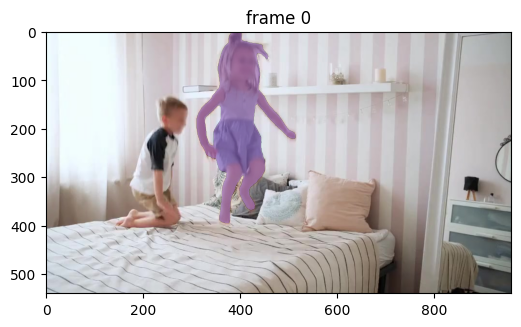

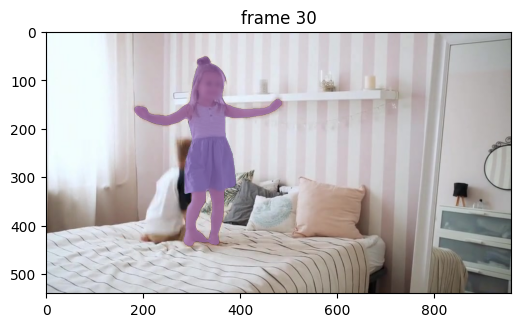

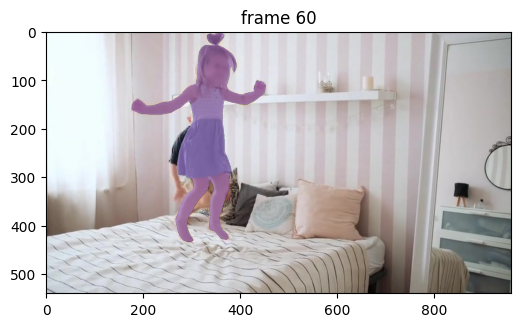

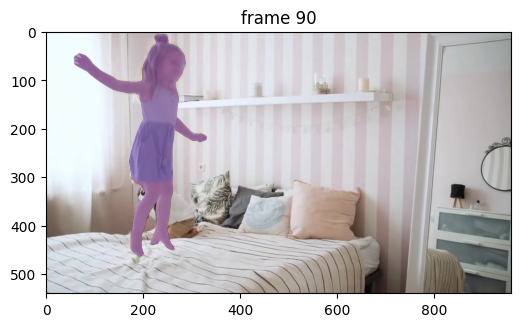

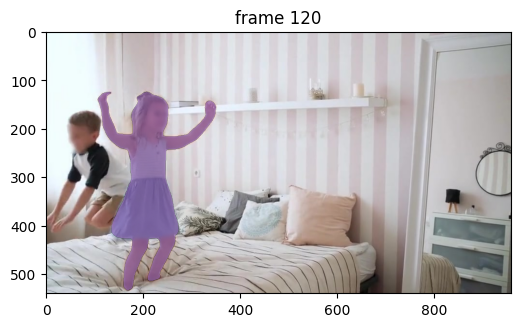

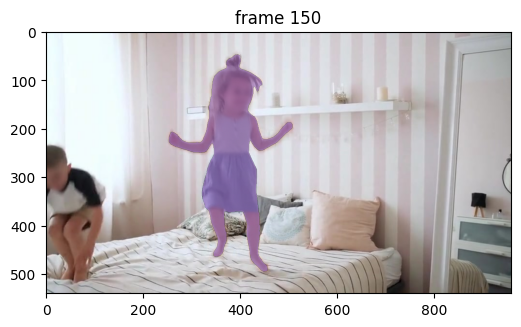

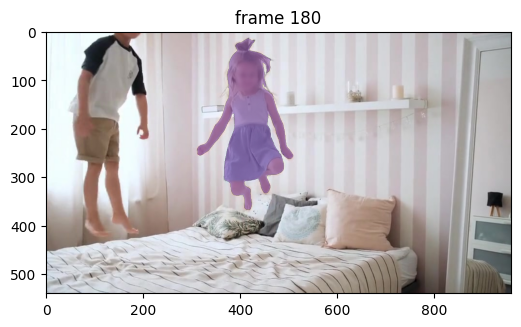

In [19]:
# run propagation throughout the video and collect the results in a dict
video_segments = {}  # video_segments contains the per-frame segmentation results
for out_frame_idx, out_obj_ids, out_mask_logits in predictor.propagate_in_video(inference_state):
    video_segments[out_frame_idx] = {
        out_obj_id: (out_mask_logits[i] > 0.0).cpu().numpy()
        for i, out_obj_id in enumerate(out_obj_ids)
    }

# render the segmentation results every few frames
vis_frame_stride = 30
plt.close("all")
for out_frame_idx in range(0, len(frame_names), vis_frame_stride):
    plt.figure(figsize=(6, 4))
    plt.title(f"frame {out_frame_idx}")
    plt.imshow(Image.open(os.path.join(video_dir, frame_names[out_frame_idx])))
    for out_obj_id, out_mask in video_segments[out_frame_idx].items():
        show_mask(out_mask, plt.gca(), obj_id=out_obj_id)

Note that in addition to clicks or boxes, SAM 2 also supports directly using a **mask prompt** as input via the `add_new_mask` method in the `SAM2VideoPredictor` class. This can be helpful in e.g. semi-supervised VOS evaluations (see [tools/vos_inference.py](https://github.com/facebookresearch/sam2/blob/main/tools/vos_inference.py) for an example).

### Example 3: Segment multiple objects simultaneously

Note: if you have run any previous tracking using this `inference_state`, please reset it first via `reset_state`.

In [20]:
predictor.reset_state(inference_state)

#### Step 1: Add two objects on a frame

SAM 2 can also segment and track two or more objects at the same time. One way, of course, is to do them one by one. However, it would be more efficient to batch them together (e.g. so that we can share the image features between objects to reduce computation costs).

This time, let's focus on object parts and segment **the shirts of both childen** in this video. Here we add prompts for these two objects and assign each of them a unique object id.

In [21]:
prompts = {}  # hold all the clicks we add for visualization

Add the first object (the left child's shirt) with a **positive click** at (x, y) = (200, 300) on frame 0.

We assign it to object id `2` (it can be arbitrary integers, and only needs to be unique for each object to track), which is passed to the `add_new_points_or_box` API to distinguish the object we are clicking upon.

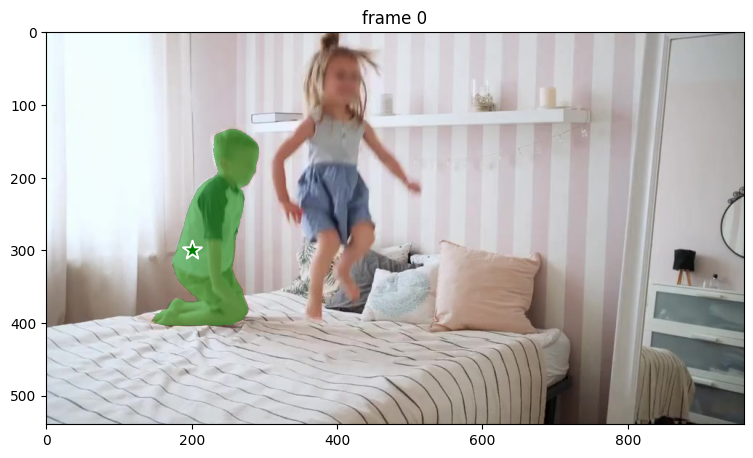

In [22]:
ann_frame_idx = 0  # the frame index we interact with
ann_obj_id = 2  # give a unique id to each object we interact with (it can be any integers)

# Let's add a positive click at (x, y) = (200, 300) to get started on the first object
points = np.array([[200, 300]], dtype=np.float32)
# for labels, `1` means positive click and `0` means negative click
labels = np.array([1], np.int32)
prompts[ann_obj_id] = points, labels
_, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
    inference_state=inference_state,
    frame_idx=ann_frame_idx,
    obj_id=ann_obj_id,
    points=points,
    labels=labels,
)

# show the results on the current (interacted) frame
plt.figure(figsize=(9, 6))
plt.title(f"frame {ann_frame_idx}")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[ann_frame_idx])))
show_points(points, labels, plt.gca())
for i, out_obj_id in enumerate(out_obj_ids):
    show_points(*prompts[out_obj_id], plt.gca())
    show_mask((out_mask_logits[i] > 0.0).cpu().numpy(), plt.gca(), obj_id=out_obj_id)

Hmm, this time we just want to select the child's shirt, but the model predicts the mask for the entire child. Let's refine the prediction with a **negative click** at (x, y) = (275, 175).

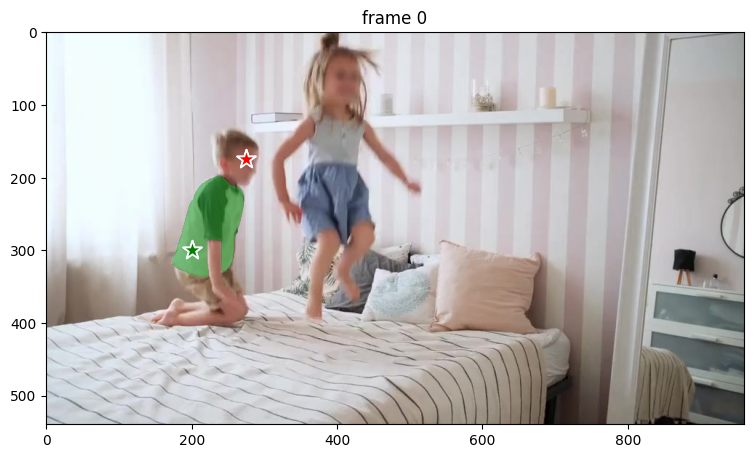

In [23]:
# add the first object
ann_frame_idx = 0  # the frame index we interact with
ann_obj_id = 2  # give a unique id to each object we interact with (it can be any integers)

# Let's add a 2nd negative click at (x, y) = (275, 175) to refine the first object
# sending all clicks (and their labels) to `add_new_points_or_box`
points = np.array([[200, 300], [275, 175]], dtype=np.float32)
# for labels, `1` means positive click and `0` means negative click
labels = np.array([1, 0], np.int32)
prompts[ann_obj_id] = points, labels
_, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
    inference_state=inference_state,
    frame_idx=ann_frame_idx,
    obj_id=ann_obj_id,
    points=points,
    labels=labels,
)

# show the results on the current (interacted) frame
plt.figure(figsize=(9, 6))
plt.title(f"frame {ann_frame_idx}")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[ann_frame_idx])))
show_points(points, labels, plt.gca())
for i, out_obj_id in enumerate(out_obj_ids):
    show_points(*prompts[out_obj_id], plt.gca())
    show_mask((out_mask_logits[i] > 0.0).cpu().numpy(), plt.gca(), obj_id=out_obj_id)

After the 2nd negative click, now we get the left child's shirt as our first object.

Let's move on to the second object (the right child's shirt) with a positive click at (x, y) = (400, 150) on frame 0. Here we assign object id `3` to this second object (it can be arbitrary integers, and only needs to be unique for each object to track).

Note: when there are multiple objects, the `add_new_points_or_box` API will return a list of masks for each object.

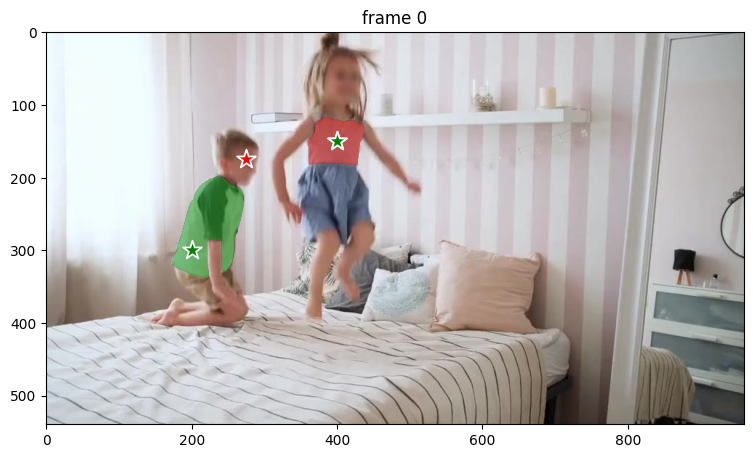

In [24]:
ann_frame_idx = 0  # the frame index we interact with
ann_obj_id = 3  # give a unique id to each object we interact with (it can be any integers)

# Let's now move on to the second object we want to track (giving it object id `3`)
# with a positive click at (x, y) = (400, 150)
points = np.array([[400, 150]], dtype=np.float32)
# for labels, `1` means positive click and `0` means negative click
labels = np.array([1], np.int32)
prompts[ann_obj_id] = points, labels

# `add_new_points_or_box` returns masks for all objects added so far on this interacted frame
_, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
    inference_state=inference_state,
    frame_idx=ann_frame_idx,
    obj_id=ann_obj_id,
    points=points,
    labels=labels,
)

# show the results on the current (interacted) frame on all objects
plt.figure(figsize=(9, 6))
plt.title(f"frame {ann_frame_idx}")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[ann_frame_idx])))
show_points(points, labels, plt.gca())
for i, out_obj_id in enumerate(out_obj_ids):
    show_points(*prompts[out_obj_id], plt.gca())
    show_mask((out_mask_logits[i] > 0.0).cpu().numpy(), plt.gca(), obj_id=out_obj_id)

This time the model predicts the mask of the shirt we want to track in just one click. Nice!

#### Step 2: Propagate the prompts to get masklets across the video

Now, we propagate the prompts for both objects to get their masklets throughout the video.

Note: when there are multiple objects, the `propagate_in_video` API will return a list of masks for each object.

propagate in video:   1%|          | 2/200 [00:00<00:33,  5.98it/s]

Processing frame 1 - Global MAD: 0.0292, Masked MAD: 0.0955


propagate in video:   2%|▏         | 3/200 [00:00<00:46,  4.20it/s]

Processing frame 2 - Global MAD: 0.0290, Masked MAD: 0.0743
Processing frame 3 - Global MAD: 0.0303, Masked MAD: 0.0553


propagate in video:   2%|▏         | 4/200 [00:01<00:54,  3.58it/s]

Processing frame 4 - Global MAD: 0.0326, Masked MAD: 0.0656


propagate in video:   2%|▎         | 5/200 [00:01<00:59,  3.26it/s]

Processing frame 5 - Global MAD: 0.0269, Masked MAD: 0.0805


propagate in video:   3%|▎         | 6/200 [00:01<01:03,  3.04it/s]

Processing frame 6 - Global MAD: 0.0254, Masked MAD: 0.1003


propagate in video:   4%|▎         | 7/200 [00:02<01:07,  2.86it/s]

Processing frame 7 - Global MAD: 0.0298, Masked MAD: 0.1258


propagate in video:   4%|▍         | 8/200 [00:02<01:09,  2.77it/s]

Processing frame 8 - Global MAD: 0.0307, Masked MAD: 0.1468


propagate in video:   4%|▍         | 9/200 [00:02<01:10,  2.69it/s]

Processing frame 9 - Global MAD: 0.0292, Masked MAD: 0.1625


propagate in video:   5%|▌         | 10/200 [00:03<01:12,  2.63it/s]

Processing frame 10 - Global MAD: 0.0290, Masked MAD: 0.1708


propagate in video:   6%|▌         | 11/200 [00:03<01:12,  2.62it/s]

Processing frame 11 - Global MAD: 0.0281, Masked MAD: 0.1621


propagate in video:   6%|▌         | 12/200 [00:04<01:12,  2.61it/s]

Processing frame 12 - Global MAD: 0.0263, Masked MAD: 0.1256


propagate in video:   6%|▋         | 13/200 [00:04<01:12,  2.57it/s]

Processing frame 13 - Global MAD: 0.0222, Masked MAD: 0.0709


propagate in video:   7%|▋         | 14/200 [00:04<01:12,  2.56it/s]

Processing frame 14 - Global MAD: 0.0241, Masked MAD: 0.0932


propagate in video:   8%|▊         | 15/200 [00:05<01:12,  2.56it/s]

Processing frame 15 - Global MAD: 0.0261, Masked MAD: 0.1184


propagate in video:   8%|▊         | 16/200 [00:05<01:12,  2.54it/s]

Processing frame 16 - Global MAD: 0.0267, Masked MAD: 0.1257


propagate in video:   8%|▊         | 17/200 [00:06<01:11,  2.55it/s]

Processing frame 17 - Global MAD: 0.0280, Masked MAD: 0.1308


propagate in video:   9%|▉         | 18/200 [00:06<01:11,  2.55it/s]

Processing frame 18 - Global MAD: 0.0275, Masked MAD: 0.1243


propagate in video:  10%|▉         | 19/200 [00:06<01:11,  2.54it/s]

Processing frame 19 - Global MAD: 0.0266, Masked MAD: 0.1136


propagate in video:  10%|█         | 20/200 [00:07<01:10,  2.54it/s]

Processing frame 20 - Global MAD: 0.0268, Masked MAD: 0.1087


propagate in video:  10%|█         | 21/200 [00:07<01:10,  2.53it/s]

Processing frame 21 - Global MAD: 0.0260, Masked MAD: 0.1003


propagate in video:  11%|█         | 22/200 [00:08<01:11,  2.48it/s]

Processing frame 22 - Global MAD: 0.0203, Masked MAD: 0.0725


propagate in video:  12%|█▏        | 23/200 [00:08<01:11,  2.48it/s]

Processing frame 23 - Global MAD: 0.0163, Masked MAD: 0.0636


propagate in video:  12%|█▏        | 24/200 [00:08<01:10,  2.51it/s]

Processing frame 24 - Global MAD: 0.0182, Masked MAD: 0.0766


propagate in video:  12%|█▎        | 25/200 [00:09<01:10,  2.47it/s]

Processing frame 25 - Global MAD: 0.0212, Masked MAD: 0.0792


propagate in video:  13%|█▎        | 26/200 [00:09<01:09,  2.50it/s]

Processing frame 26 - Global MAD: 0.0195, Masked MAD: 0.0773


propagate in video:  14%|█▎        | 27/200 [00:10<01:09,  2.49it/s]

Processing frame 27 - Global MAD: 0.0205, Masked MAD: 0.0932


propagate in video:  14%|█▍        | 28/200 [00:10<01:09,  2.49it/s]

Processing frame 28 - Global MAD: 0.0173, Masked MAD: 0.0987


propagate in video:  14%|█▍        | 29/200 [00:10<01:08,  2.50it/s]

Processing frame 29 - Global MAD: 0.0182, Masked MAD: 0.1065


propagate in video:  15%|█▌        | 30/200 [00:11<01:07,  2.51it/s]

Processing frame 30 - Global MAD: 0.0176, Masked MAD: 0.1050


propagate in video:  16%|█▌        | 31/200 [00:11<01:07,  2.52it/s]

Avg FPS last 30 frames: 2.57
Processing frame 31 - Global MAD: 0.0212, Masked MAD: 0.0951


propagate in video:  16%|█▌        | 32/200 [00:12<01:07,  2.49it/s]

Processing frame 32 - Global MAD: 0.0192, Masked MAD: 0.0708


propagate in video:  16%|█▋        | 33/200 [00:12<01:06,  2.51it/s]

Processing frame 33 - Global MAD: 0.0205, Masked MAD: 0.0694


propagate in video:  17%|█▋        | 34/200 [00:12<01:06,  2.51it/s]

Processing frame 34 - Global MAD: 0.0229, Masked MAD: 0.1102


propagate in video:  18%|█▊        | 35/200 [00:13<01:05,  2.52it/s]

Processing frame 35 - Global MAD: 0.0215, Masked MAD: 0.1236


propagate in video:  18%|█▊        | 36/200 [00:13<01:05,  2.52it/s]

Processing frame 36 - Global MAD: 0.0195, Masked MAD: 0.0995


propagate in video:  18%|█▊        | 37/200 [00:14<01:04,  2.53it/s]

Processing frame 37 - Global MAD: 0.0197, Masked MAD: 0.0996


propagate in video:  19%|█▉        | 38/200 [00:14<01:04,  2.53it/s]

Processing frame 38 - Global MAD: 0.0242, Masked MAD: 0.1107


propagate in video:  20%|█▉        | 39/200 [00:14<01:04,  2.50it/s]

Processing frame 39 - Global MAD: 0.0245, Masked MAD: 0.1131


propagate in video:  20%|██        | 40/200 [00:15<01:03,  2.50it/s]

Processing frame 40 - Global MAD: 0.0226, Masked MAD: 0.1117


propagate in video:  20%|██        | 41/200 [00:15<01:03,  2.51it/s]

Processing frame 41 - Global MAD: 0.0183, Masked MAD: 0.0959


propagate in video:  21%|██        | 42/200 [00:16<01:03,  2.50it/s]

Processing frame 42 - Global MAD: 0.0145, Masked MAD: 0.0888


propagate in video:  22%|██▏       | 43/200 [00:16<01:03,  2.48it/s]

Processing frame 43 - Global MAD: 0.0136, Masked MAD: 0.0824


propagate in video:  22%|██▏       | 44/200 [00:16<01:02,  2.49it/s]

Processing frame 44 - Global MAD: 0.0135, Masked MAD: 0.0691


propagate in video:  22%|██▎       | 45/200 [00:17<01:02,  2.49it/s]

Processing frame 45 - Global MAD: 0.0140, Masked MAD: 0.0610


propagate in video:  23%|██▎       | 46/200 [00:17<01:01,  2.49it/s]

Processing frame 46 - Global MAD: 0.0154, Masked MAD: 0.0653


propagate in video:  24%|██▎       | 47/200 [00:18<01:01,  2.47it/s]

Processing frame 47 - Global MAD: 0.0161, Masked MAD: 0.0745


propagate in video:  24%|██▍       | 48/200 [00:18<01:04,  2.34it/s]

Processing frame 48 - Global MAD: 0.0170, Masked MAD: 0.0987


propagate in video:  24%|██▍       | 49/200 [00:19<01:05,  2.32it/s]

Processing frame 49 - Global MAD: 0.0187, Masked MAD: 0.1164


propagate in video:  25%|██▌       | 50/200 [00:19<01:05,  2.29it/s]

Processing frame 50 - Global MAD: 0.0204, Masked MAD: 0.1087


propagate in video:  26%|██▌       | 51/200 [00:19<01:08,  2.18it/s]

Processing frame 51 - Global MAD: 0.0227, Masked MAD: 0.0930


propagate in video:  26%|██▌       | 52/200 [00:20<01:07,  2.18it/s]

Processing frame 52 - Global MAD: 0.0193, Masked MAD: 0.0666


propagate in video:  26%|██▋       | 53/200 [00:20<01:08,  2.16it/s]

Processing frame 53 - Global MAD: 0.0178, Masked MAD: 0.0652


propagate in video:  27%|██▋       | 54/200 [00:21<01:08,  2.14it/s]

Processing frame 54 - Global MAD: 0.0248, Masked MAD: 0.0985


propagate in video:  28%|██▊       | 55/200 [00:21<01:10,  2.05it/s]

Processing frame 55 - Global MAD: 0.0251, Masked MAD: 0.1044


propagate in video:  28%|██▊       | 56/200 [00:22<01:08,  2.10it/s]

Processing frame 56 - Global MAD: 0.0233, Masked MAD: 0.1100


propagate in video:  28%|██▊       | 57/200 [00:22<01:06,  2.14it/s]

Processing frame 57 - Global MAD: 0.0208, Masked MAD: 0.0989


propagate in video:  29%|██▉       | 58/200 [00:23<01:06,  2.12it/s]

Processing frame 58 - Global MAD: 0.0205, Masked MAD: 0.0797


propagate in video:  30%|██▉       | 59/200 [00:23<01:05,  2.17it/s]

Processing frame 59 - Global MAD: 0.0184, Masked MAD: 0.0708


propagate in video:  30%|███       | 60/200 [00:24<01:03,  2.20it/s]

Processing frame 60 - Global MAD: 0.0154, Masked MAD: 0.0662


propagate in video:  30%|███       | 61/200 [00:24<01:05,  2.14it/s]

Avg FPS last 30 frames: 2.31
Processing frame 61 - Global MAD: 0.0164, Masked MAD: 0.0686


propagate in video:  31%|███       | 62/200 [00:25<01:04,  2.15it/s]

Processing frame 62 - Global MAD: 0.0173, Masked MAD: 0.0571


propagate in video:  32%|███▏      | 63/200 [00:25<01:02,  2.18it/s]

Processing frame 63 - Global MAD: 0.0188, Masked MAD: 0.0704


propagate in video:  32%|███▏      | 64/200 [00:26<01:02,  2.17it/s]

Processing frame 64 - Global MAD: 0.0192, Masked MAD: 0.0715


propagate in video:  32%|███▎      | 65/200 [00:26<01:01,  2.21it/s]

Processing frame 65 - Global MAD: 0.0199, Masked MAD: 0.0729


propagate in video:  33%|███▎      | 66/200 [00:26<00:59,  2.26it/s]

Processing frame 66 - Global MAD: 0.0209, Masked MAD: 0.0757


propagate in video:  34%|███▎      | 67/200 [00:27<00:58,  2.25it/s]

Processing frame 67 - Global MAD: 0.0216, Masked MAD: 0.0759


propagate in video:  34%|███▍      | 68/200 [00:27<00:58,  2.24it/s]

Processing frame 68 - Global MAD: 0.0171, Masked MAD: 0.0715


propagate in video:  34%|███▍      | 69/200 [00:28<00:58,  2.25it/s]

Processing frame 69 - Global MAD: 0.0203, Masked MAD: 0.0842


propagate in video:  35%|███▌      | 70/200 [00:28<00:58,  2.22it/s]

Processing frame 70 - Global MAD: 0.0227, Masked MAD: 0.1121


propagate in video:  36%|███▌      | 71/200 [00:29<00:58,  2.22it/s]

Processing frame 71 - Global MAD: 0.0205, Masked MAD: 0.1034


propagate in video:  36%|███▌      | 72/200 [00:29<00:57,  2.22it/s]

Processing frame 72 - Global MAD: 0.0246, Masked MAD: 0.1084


propagate in video:  36%|███▋      | 73/200 [00:30<00:58,  2.15it/s]

Processing frame 73 - Global MAD: 0.0249, Masked MAD: 0.1062


propagate in video:  37%|███▋      | 74/200 [00:30<01:01,  2.05it/s]

Processing frame 74 - Global MAD: 0.0213, Masked MAD: 0.0953


propagate in video:  38%|███▊      | 75/200 [00:31<01:03,  1.98it/s]

Processing frame 75 - Global MAD: 0.0201, Masked MAD: 0.0870


propagate in video:  38%|███▊      | 76/200 [00:31<01:04,  1.91it/s]

Processing frame 76 - Global MAD: 0.0162, Masked MAD: 0.0948


propagate in video:  38%|███▊      | 77/200 [00:32<01:04,  1.92it/s]

Processing frame 77 - Global MAD: 0.0162, Masked MAD: 0.0823


propagate in video:  39%|███▉      | 78/200 [00:32<01:03,  1.91it/s]

Processing frame 78 - Global MAD: 0.0184, Masked MAD: 0.0678


propagate in video:  40%|███▉      | 79/200 [00:33<01:04,  1.87it/s]

Processing frame 79 - Global MAD: 0.0201, Masked MAD: 0.0841


propagate in video:  40%|████      | 80/200 [00:33<01:04,  1.87it/s]

Processing frame 80 - Global MAD: 0.0208, Masked MAD: 0.0852


propagate in video:  40%|████      | 81/200 [00:34<01:01,  1.94it/s]

Processing frame 81 - Global MAD: 0.0207, Masked MAD: 0.0954


propagate in video:  41%|████      | 82/200 [00:34<00:59,  1.99it/s]

Processing frame 82 - Global MAD: 0.0224, Masked MAD: 0.0906


propagate in video:  42%|████▏     | 83/200 [00:35<00:57,  2.04it/s]

Processing frame 83 - Global MAD: 0.0240, Masked MAD: 0.0854


propagate in video:  42%|████▏     | 84/200 [00:35<00:55,  2.08it/s]

Processing frame 84 - Global MAD: 0.0255, Masked MAD: 0.0725


propagate in video:  43%|████▎     | 86/200 [00:36<00:45,  2.52it/s]

Skipping frame 85 - Global MAD: 0.0187, Masked MAD: 0.0486 (threshold: 0.05)
Processing frame 86 - Global MAD: 0.0313, Masked MAD: 0.0918


propagate in video:  44%|████▎     | 87/200 [00:36<00:46,  2.43it/s]

Processing frame 87 - Global MAD: 0.0281, Masked MAD: 0.0932


propagate in video:  44%|████▍     | 88/200 [00:37<00:47,  2.35it/s]

Processing frame 88 - Global MAD: 0.0267, Masked MAD: 0.0925


propagate in video:  44%|████▍     | 89/200 [00:37<00:49,  2.26it/s]

Processing frame 89 - Global MAD: 0.0253, Masked MAD: 0.0776


propagate in video:  45%|████▌     | 90/200 [00:38<00:49,  2.21it/s]

Processing frame 90 - Global MAD: 0.0238, Masked MAD: 0.0641


propagate in video:  46%|████▌     | 91/200 [00:38<00:51,  2.14it/s]

Avg FPS last 30 frames: 2.12
Processing frame 91 - Global MAD: 0.0191, Masked MAD: 0.0546


propagate in video:  46%|████▌     | 92/200 [00:39<00:50,  2.16it/s]

Processing frame 92 - Global MAD: 0.0201, Masked MAD: 0.0667


propagate in video:  46%|████▋     | 93/200 [00:39<00:50,  2.13it/s]

Processing frame 93 - Global MAD: 0.0206, Masked MAD: 0.0756


propagate in video:  47%|████▋     | 94/200 [00:40<00:49,  2.13it/s]

Processing frame 94 - Global MAD: 0.0202, Masked MAD: 0.0854


propagate in video:  48%|████▊     | 95/200 [00:40<00:48,  2.16it/s]

Processing frame 95 - Global MAD: 0.0213, Masked MAD: 0.0829


propagate in video:  48%|████▊     | 96/200 [00:41<00:47,  2.21it/s]

Processing frame 96 - Global MAD: 0.0229, Masked MAD: 0.0836


propagate in video:  48%|████▊     | 97/200 [00:41<00:45,  2.29it/s]

Processing frame 97 - Global MAD: 0.0232, Masked MAD: 0.0755


propagate in video:  49%|████▉     | 98/200 [00:41<00:43,  2.33it/s]

Processing frame 98 - Global MAD: 0.0229, Masked MAD: 0.1006


propagate in video:  50%|████▉     | 99/200 [00:42<00:42,  2.38it/s]

Processing frame 99 - Global MAD: 0.0237, Masked MAD: 0.1155


propagate in video:  50%|█████     | 100/200 [00:42<00:44,  2.25it/s]

Processing frame 100 - Global MAD: 0.0265, Masked MAD: 0.1222


propagate in video:  50%|█████     | 101/200 [00:43<00:43,  2.26it/s]

Processing frame 101 - Global MAD: 0.0254, Masked MAD: 0.1009


propagate in video:  51%|█████     | 102/200 [00:43<00:43,  2.26it/s]

Processing frame 102 - Global MAD: 0.0173, Masked MAD: 0.0540


propagate in video:  52%|█████▏    | 103/200 [00:44<00:41,  2.32it/s]

Processing frame 103 - Global MAD: 0.0265, Masked MAD: 0.1240


propagate in video:  52%|█████▏    | 104/200 [00:44<00:41,  2.30it/s]

Processing frame 104 - Global MAD: 0.0274, Masked MAD: 0.1429


propagate in video:  52%|█████▎    | 105/200 [00:44<00:41,  2.26it/s]

Processing frame 105 - Global MAD: 0.0279, Masked MAD: 0.1431


propagate in video:  53%|█████▎    | 106/200 [00:45<00:41,  2.27it/s]

Processing frame 106 - Global MAD: 0.0287, Masked MAD: 0.1557


propagate in video:  54%|█████▎    | 107/200 [00:45<00:41,  2.23it/s]

Processing frame 107 - Global MAD: 0.0279, Masked MAD: 0.1455


propagate in video:  54%|█████▍    | 108/200 [00:46<00:40,  2.25it/s]

Processing frame 108 - Global MAD: 0.0253, Masked MAD: 0.1270


propagate in video:  55%|█████▍    | 109/200 [00:46<00:39,  2.30it/s]

Processing frame 109 - Global MAD: 0.0211, Masked MAD: 0.0903


propagate in video:  55%|█████▌    | 110/200 [00:47<00:38,  2.31it/s]

Processing frame 110 - Global MAD: 0.0206, Masked MAD: 0.0900


propagate in video:  56%|█████▌    | 111/200 [00:47<00:38,  2.32it/s]

Processing frame 111 - Global MAD: 0.0226, Masked MAD: 0.1154


propagate in video:  56%|█████▌    | 112/200 [00:47<00:37,  2.35it/s]

Processing frame 112 - Global MAD: 0.0229, Masked MAD: 0.1263


propagate in video:  56%|█████▋    | 113/200 [00:48<00:36,  2.36it/s]

Processing frame 113 - Global MAD: 0.0239, Masked MAD: 0.1368


propagate in video:  57%|█████▋    | 114/200 [00:48<00:36,  2.38it/s]

Processing frame 114 - Global MAD: 0.0286, Masked MAD: 0.1587


propagate in video:  57%|█████▊    | 115/200 [00:49<00:35,  2.39it/s]

Processing frame 115 - Global MAD: 0.0308, Masked MAD: 0.1634


propagate in video:  58%|█████▊    | 116/200 [00:49<00:34,  2.42it/s]

Processing frame 116 - Global MAD: 0.0301, Masked MAD: 0.1481


propagate in video:  58%|█████▊    | 117/200 [00:50<00:34,  2.42it/s]

Processing frame 117 - Global MAD: 0.0297, Masked MAD: 0.1394


propagate in video:  59%|█████▉    | 118/200 [00:50<00:33,  2.46it/s]

Processing frame 118 - Global MAD: 0.0315, Masked MAD: 0.1308


propagate in video:  60%|█████▉    | 119/200 [00:50<00:32,  2.48it/s]

Processing frame 119 - Global MAD: 0.0323, Masked MAD: 0.1005


propagate in video:  60%|██████    | 120/200 [00:51<00:32,  2.49it/s]

Processing frame 120 - Global MAD: 0.0249, Masked MAD: 0.0804


propagate in video:  60%|██████    | 121/200 [00:51<00:32,  2.47it/s]

Avg FPS last 30 frames: 2.33
Processing frame 121 - Global MAD: 0.0319, Masked MAD: 0.1165


propagate in video:  61%|██████    | 122/200 [00:52<00:32,  2.42it/s]

Processing frame 122 - Global MAD: 0.0348, Masked MAD: 0.1380


propagate in video:  62%|██████▏   | 123/200 [00:52<00:32,  2.38it/s]

Processing frame 123 - Global MAD: 0.0364, Masked MAD: 0.1516


propagate in video:  62%|██████▏   | 124/200 [00:52<00:31,  2.42it/s]

Processing frame 124 - Global MAD: 0.0357, Masked MAD: 0.1600


propagate in video:  62%|██████▎   | 125/200 [00:53<00:30,  2.46it/s]

Processing frame 125 - Global MAD: 0.0363, Masked MAD: 0.1589


propagate in video:  63%|██████▎   | 126/200 [00:53<00:29,  2.48it/s]

Processing frame 126 - Global MAD: 0.0363, Masked MAD: 0.1380


propagate in video:  64%|██████▎   | 127/200 [00:54<00:29,  2.50it/s]

Processing frame 127 - Global MAD: 0.0325, Masked MAD: 0.0927


propagate in video:  64%|██████▍   | 128/200 [00:54<00:28,  2.50it/s]

Processing frame 128 - Global MAD: 0.0289, Masked MAD: 0.0632


propagate in video:  64%|██████▍   | 129/200 [00:54<00:28,  2.48it/s]

Processing frame 129 - Global MAD: 0.0308, Masked MAD: 0.0950


propagate in video:  65%|██████▌   | 130/200 [00:55<00:28,  2.48it/s]

Processing frame 130 - Global MAD: 0.0317, Masked MAD: 0.1045


propagate in video:  66%|██████▌   | 131/200 [00:55<00:27,  2.49it/s]

Processing frame 131 - Global MAD: 0.0350, Masked MAD: 0.1056


propagate in video:  66%|██████▌   | 132/200 [00:56<00:27,  2.50it/s]

Processing frame 132 - Global MAD: 0.0359, Masked MAD: 0.1109


propagate in video:  66%|██████▋   | 133/200 [00:56<00:26,  2.52it/s]

Processing frame 133 - Global MAD: 0.0360, Masked MAD: 0.0980


propagate in video:  67%|██████▋   | 134/200 [00:56<00:26,  2.53it/s]

Processing frame 134 - Global MAD: 0.0360, Masked MAD: 0.0820


propagate in video:  68%|██████▊   | 135/200 [00:57<00:25,  2.53it/s]

Processing frame 135 - Global MAD: 0.0347, Masked MAD: 0.0695


propagate in video:  68%|██████▊   | 136/200 [00:57<00:25,  2.55it/s]

Processing frame 136 - Global MAD: 0.0360, Masked MAD: 0.0641


propagate in video:  68%|██████▊   | 137/200 [00:58<00:24,  2.55it/s]

Processing frame 137 - Global MAD: 0.0337, Masked MAD: 0.0779


propagate in video:  69%|██████▉   | 138/200 [00:58<00:24,  2.52it/s]

Processing frame 138 - Global MAD: 0.0290, Masked MAD: 0.0852


propagate in video:  70%|██████▉   | 139/200 [00:58<00:24,  2.52it/s]

Processing frame 139 - Global MAD: 0.0340, Masked MAD: 0.1043


propagate in video:  70%|███████   | 140/200 [00:59<00:23,  2.53it/s]

Processing frame 140 - Global MAD: 0.0359, Masked MAD: 0.1362


propagate in video:  70%|███████   | 141/200 [00:59<00:23,  2.54it/s]

Processing frame 141 - Global MAD: 0.0376, Masked MAD: 0.1533


propagate in video:  71%|███████   | 142/200 [01:00<00:22,  2.55it/s]

Processing frame 142 - Global MAD: 0.0394, Masked MAD: 0.1588


propagate in video:  72%|███████▏  | 143/200 [01:00<00:23,  2.47it/s]

Processing frame 143 - Global MAD: 0.0375, Masked MAD: 0.1562


propagate in video:  72%|███████▏  | 144/200 [01:00<00:23,  2.41it/s]

Processing frame 144 - Global MAD: 0.0355, Masked MAD: 0.1491


propagate in video:  72%|███████▎  | 145/200 [01:01<00:22,  2.44it/s]

Processing frame 145 - Global MAD: 0.0304, Masked MAD: 0.0908


propagate in video:  73%|███████▎  | 146/200 [01:01<00:21,  2.47it/s]

Processing frame 146 - Global MAD: 0.0294, Masked MAD: 0.0745


propagate in video:  74%|███████▎  | 147/200 [01:02<00:21,  2.50it/s]

Processing frame 147 - Global MAD: 0.0321, Masked MAD: 0.1311


propagate in video:  74%|███████▍  | 148/200 [01:02<00:20,  2.51it/s]

Processing frame 148 - Global MAD: 0.0341, Masked MAD: 0.1176


propagate in video:  74%|███████▍  | 149/200 [01:02<00:20,  2.47it/s]

Processing frame 149 - Global MAD: 0.0373, Masked MAD: 0.1231


propagate in video:  75%|███████▌  | 150/200 [01:03<00:20,  2.40it/s]

Processing frame 150 - Global MAD: 0.0396, Masked MAD: 0.1375


propagate in video:  76%|███████▌  | 151/200 [01:03<00:20,  2.40it/s]

Avg FPS last 30 frames: 2.48
Processing frame 151 - Global MAD: 0.0410, Masked MAD: 0.1588


propagate in video:  76%|███████▌  | 152/200 [01:04<00:20,  2.37it/s]

Processing frame 152 - Global MAD: 0.0424, Masked MAD: 0.1676


propagate in video:  76%|███████▋  | 153/200 [01:04<00:20,  2.35it/s]

Processing frame 153 - Global MAD: 0.0442, Masked MAD: 0.1692


propagate in video:  77%|███████▋  | 154/200 [01:05<00:19,  2.38it/s]

Processing frame 154 - Global MAD: 0.0385, Masked MAD: 0.1513


propagate in video:  78%|███████▊  | 155/200 [01:05<00:18,  2.37it/s]

Processing frame 155 - Global MAD: 0.0410, Masked MAD: 0.1395


propagate in video:  78%|███████▊  | 156/200 [01:05<00:18,  2.36it/s]

Processing frame 156 - Global MAD: 0.0452, Masked MAD: 0.1268


propagate in video:  78%|███████▊  | 157/200 [01:06<00:18,  2.38it/s]

Processing frame 157 - Global MAD: 0.0453, Masked MAD: 0.1131


propagate in video:  79%|███████▉  | 158/200 [01:06<00:17,  2.35it/s]

Processing frame 158 - Global MAD: 0.0440, Masked MAD: 0.0998


propagate in video:  80%|███████▉  | 159/200 [01:07<00:17,  2.31it/s]

Processing frame 159 - Global MAD: 0.0383, Masked MAD: 0.0885


propagate in video:  80%|████████  | 160/200 [01:07<00:17,  2.28it/s]

Processing frame 160 - Global MAD: 0.0331, Masked MAD: 0.0710


propagate in video:  80%|████████  | 161/200 [01:08<00:17,  2.17it/s]

Processing frame 161 - Global MAD: 0.0285, Masked MAD: 0.0566


propagate in video:  81%|████████  | 162/200 [01:08<00:17,  2.21it/s]

Processing frame 162 - Global MAD: 0.0282, Masked MAD: 0.0603


propagate in video:  82%|████████▏ | 163/200 [01:09<00:16,  2.21it/s]

Processing frame 163 - Global MAD: 0.0268, Masked MAD: 0.0666


propagate in video:  82%|████████▏ | 164/200 [01:09<00:16,  2.22it/s]

Processing frame 164 - Global MAD: 0.0309, Masked MAD: 0.0824


propagate in video:  82%|████████▎ | 165/200 [01:09<00:15,  2.25it/s]

Processing frame 165 - Global MAD: 0.0358, Masked MAD: 0.1048


propagate in video:  83%|████████▎ | 166/200 [01:10<00:14,  2.27it/s]

Processing frame 166 - Global MAD: 0.0369, Masked MAD: 0.1219


propagate in video:  84%|████████▎ | 167/200 [01:10<00:14,  2.32it/s]

Processing frame 167 - Global MAD: 0.0387, Masked MAD: 0.1308


propagate in video:  84%|████████▍ | 168/200 [01:11<00:13,  2.30it/s]

Processing frame 168 - Global MAD: 0.0383, Masked MAD: 0.1339


propagate in video:  84%|████████▍ | 169/200 [01:11<00:13,  2.34it/s]

Processing frame 169 - Global MAD: 0.0336, Masked MAD: 0.1010


propagate in video:  85%|████████▌ | 170/200 [01:12<00:12,  2.38it/s]

Processing frame 170 - Global MAD: 0.0312, Masked MAD: 0.0904


propagate in video:  86%|████████▌ | 171/200 [01:12<00:12,  2.38it/s]

Processing frame 171 - Global MAD: 0.0327, Masked MAD: 0.1170


propagate in video:  86%|████████▌ | 172/200 [01:12<00:11,  2.41it/s]

Processing frame 172 - Global MAD: 0.0373, Masked MAD: 0.1360


propagate in video:  86%|████████▋ | 173/200 [01:13<00:11,  2.42it/s]

Processing frame 173 - Global MAD: 0.0375, Masked MAD: 0.1262


propagate in video:  87%|████████▋ | 174/200 [01:13<00:10,  2.44it/s]

Processing frame 174 - Global MAD: 0.0365, Masked MAD: 0.1142


propagate in video:  88%|████████▊ | 175/200 [01:14<00:10,  2.45it/s]

Processing frame 175 - Global MAD: 0.0309, Masked MAD: 0.1035


propagate in video:  88%|████████▊ | 176/200 [01:14<00:09,  2.45it/s]

Processing frame 176 - Global MAD: 0.0304, Masked MAD: 0.0911


propagate in video:  88%|████████▊ | 177/200 [01:14<00:09,  2.46it/s]

Processing frame 177 - Global MAD: 0.0253, Masked MAD: 0.0780


propagate in video:  89%|████████▉ | 178/200 [01:15<00:08,  2.45it/s]

Processing frame 178 - Global MAD: 0.0203, Masked MAD: 0.0669


propagate in video:  90%|████████▉ | 179/200 [01:15<00:08,  2.47it/s]

Processing frame 179 - Global MAD: 0.0197, Masked MAD: 0.0537


propagate in video:  90%|█████████ | 180/200 [01:16<00:08,  2.47it/s]

Processing frame 180 - Global MAD: 0.0220, Masked MAD: 0.0594


propagate in video:  90%|█████████ | 181/200 [01:16<00:07,  2.48it/s]

Avg FPS last 30 frames: 2.36
Processing frame 181 - Global MAD: 0.0245, Masked MAD: 0.0852


propagate in video:  91%|█████████ | 182/200 [01:16<00:07,  2.49it/s]

Processing frame 182 - Global MAD: 0.0291, Masked MAD: 0.1109


propagate in video:  92%|█████████▏| 183/200 [01:17<00:06,  2.49it/s]

Processing frame 183 - Global MAD: 0.0329, Masked MAD: 0.1284


propagate in video:  92%|█████████▏| 184/200 [01:17<00:06,  2.50it/s]

Processing frame 184 - Global MAD: 0.0378, Masked MAD: 0.1594


propagate in video:  92%|█████████▎| 185/200 [01:18<00:06,  2.50it/s]

Processing frame 185 - Global MAD: 0.0434, Masked MAD: 0.1944


propagate in video:  93%|█████████▎| 186/200 [01:18<00:05,  2.50it/s]

Processing frame 186 - Global MAD: 0.0461, Masked MAD: 0.2237


propagate in video:  94%|█████████▎| 187/200 [01:18<00:05,  2.46it/s]

Processing frame 187 - Global MAD: 0.0440, Masked MAD: 0.2285


propagate in video:  94%|█████████▍| 188/200 [01:19<00:04,  2.47it/s]

Processing frame 188 - Global MAD: 0.0401, Masked MAD: 0.1995


propagate in video:  94%|█████████▍| 189/200 [01:19<00:04,  2.48it/s]

Processing frame 189 - Global MAD: 0.0323, Masked MAD: 0.1176


propagate in video:  95%|█████████▌| 190/200 [01:20<00:04,  2.48it/s]

Processing frame 190 - Global MAD: 0.0310, Masked MAD: 0.0792


propagate in video:  96%|█████████▌| 191/200 [01:20<00:03,  2.48it/s]

Processing frame 191 - Global MAD: 0.0398, Masked MAD: 0.1286


propagate in video:  96%|█████████▌| 192/200 [01:20<00:03,  2.49it/s]

Processing frame 192 - Global MAD: 0.0407, Masked MAD: 0.1336


propagate in video:  96%|█████████▋| 193/200 [01:21<00:02,  2.48it/s]

Processing frame 193 - Global MAD: 0.0381, Masked MAD: 0.1291


propagate in video:  97%|█████████▋| 194/200 [01:21<00:02,  2.47it/s]

Processing frame 194 - Global MAD: 0.0357, Masked MAD: 0.1091


propagate in video:  98%|█████████▊| 195/200 [01:22<00:02,  2.47it/s]

Processing frame 195 - Global MAD: 0.0337, Masked MAD: 0.0991


propagate in video:  98%|█████████▊| 196/200 [01:22<00:01,  2.47it/s]

Processing frame 196 - Global MAD: 0.0312, Masked MAD: 0.0870


propagate in video:  98%|█████████▊| 197/200 [01:22<00:01,  2.46it/s]

Processing frame 197 - Global MAD: 0.0299, Masked MAD: 0.0810


propagate in video:  99%|█████████▉| 198/200 [01:23<00:00,  2.46it/s]

Processing frame 198 - Global MAD: 0.0299, Masked MAD: 0.0649


propagate in video: 100%|██████████| 200/200 [01:23<00:00,  2.38it/s]


Skipping frame 199 - Global MAD: 0.0280, Masked MAD: 0.0478 (threshold: 0.05)
Skipped 2 frames due to low MAD.


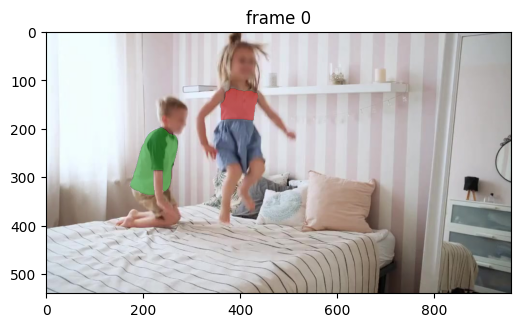

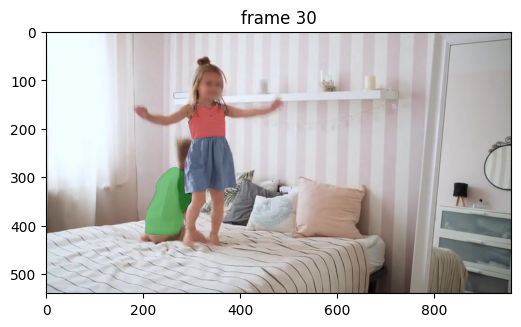

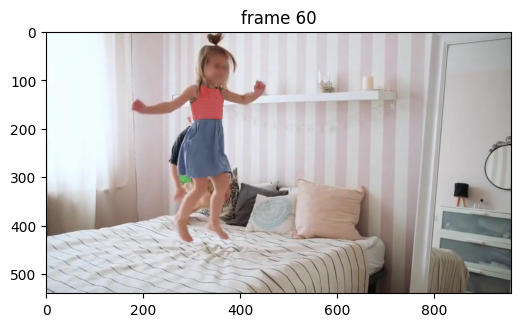

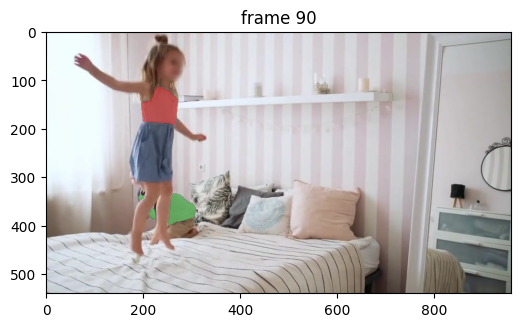

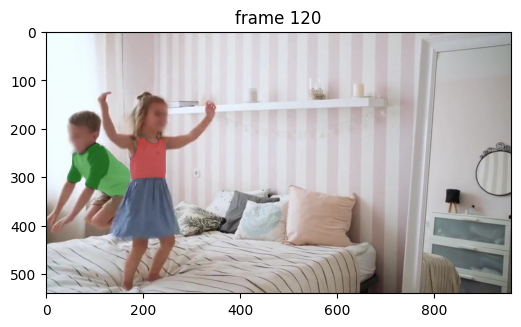

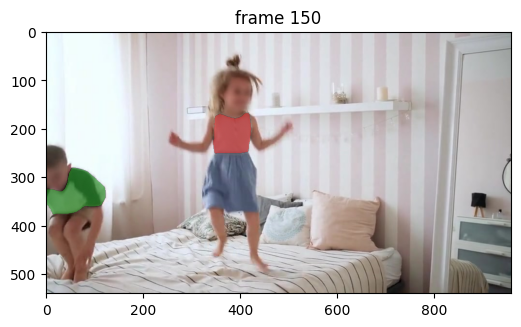

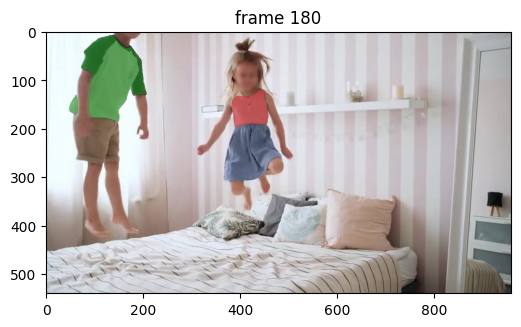

In [25]:
# run propagation throughout the video and collect the results in a dict
video_segments = {}  # video_segments contains the per-frame segmentation results
for out_frame_idx, out_obj_ids, out_mask_logits in predictor.propagate_in_video(inference_state):
    video_segments[out_frame_idx] = {
        out_obj_id: (out_mask_logits[i] > 0.0).cpu().numpy()
        for i, out_obj_id in enumerate(out_obj_ids)
    }

# render the segmentation results every few frames
vis_frame_stride = 30
plt.close("all")
for out_frame_idx in range(0, len(frame_names), vis_frame_stride):
    plt.figure(figsize=(6, 4))
    plt.title(f"frame {out_frame_idx}")
    plt.imshow(Image.open(os.path.join(video_dir, frame_names[out_frame_idx])))
    for out_obj_id, out_mask in video_segments[out_frame_idx].items():
        show_mask(out_mask, plt.gca(), obj_id=out_obj_id)

Looks like both children's shirts are well segmented in this video.

Now you can try SAM 2 on your own videos and use cases! 